# Breast Ultrasound Image Classification
### By Lie Li

This capstone project is for DTSC 690, focuses on the classification of breast ultrasound images using deep learning techniques. The primary objective is to develop and evaluate multiple Convolutional Neural Network (CNN) models for accurate classification of breast health conditions, including normal, benign, and malignant cases.

## Data Description

Data Source : https://www.kaggle.com/datasets/aryashah2k/breast-ultrasound-images-dataset 

The dataset comprises breast ultrasound images obtained from a diverse group of 600 female patients ranging in age from 25 to 75 years. The collection encompasses a total of 780 images with an average size of 500 x 500 pixels stored in PNG format. The images are meticulously categorized into three distinct classes encompassing the range of cancer-related breast health
conditions: normal, benign, and malignant (Al-Dhabyani et al. 2019).

## Steps taken:
#### Import the data set.
Load data by keras.utils.image_dataset_from_directory which automatically generate ane one hot encoded the labels based on the data directory and resize the image (default 256,256).

#### Explore and visulize the data
1. Display a representative image, analyze the image properties, such as the image pixel min and max values, image channels et al;
2. Display sample images and their corresponding labels for each class (Benign, Malignant, or Normal).

#### Build a 4 trainable layers CNN model and train the model on the full dataset to classify the breast ultrasound images and perform the evaluation on the test dataset
1. Scale image data values btw 0 to 1 instead of 0 to 255 which help the model generalize faster and produces better prediction;
2. Split the dataset into training, validation and test dataset;
3. Build and train a 4 trainable layers Sequential CNN model on the full dataset;
4. Optimize the model by modifying the model architecture and fine tune the hyperparamers;
5. Conduct Random_search and find the best model; Save the trained model for deployment;
6. Evaluate the model performance by computing the the accuracy, precision, recall scores, confusion_matrix, AUC for the test set.

#### Further visulize the data by performing Dimension Reduction/feature extraction
1. Utilize the UMAP/TSNE technique for data visualization.
2. Perform dimensionality reduction using PCA, followed by UMAP
3. Perform feature extraction using ResNet50, followed by UMAP.

#### Train the 4 trainable layers CNN model on the reduced dataset to classify the breast ultrasound images and perform the evaluation on the test dataset
1. Perform dimensionality reduction using PCA and keep 95% variance;
2. Split the dataset into training, validation and test dataset;
3. Build and train a Sequential CNN model on the reduced dataset;
4. Optimize the model by modifying the model structure and fine tune the hyperparamers;
5. Evaluate the model performance by computing the the accuracy, precision, recall scores, confusion_matrix, AUC for the test set.

#### Build a Deep Learning model using Resnet50 and train the model on the full dataset to classify the breast ultrasound images and perform the evaluation on the test dataset
1. Split the dataset into training, validation, and test sets.
2. Build a deep learning model using ResNet50 architecture.
3. Freeze the weights of the first 165 layers and fine-tune the remaining layers.
4. Implement transfer learning by adding additional layers.
5. Use techniques such as EarlyStop and Learning Rate Scheduling to address overfitting.
6. Train the model on the training dataset.
7. Evaluate the model's performance on the test set using various metrics.

#### Build a Deep Learning model using Resnet50 and applying imgae augmentation to increase the data diversity
1. Split the dataset into training, validation, and test sets.
2. Build a deep learning model using ResNet50 architecture and applying image augmentation.
3. Freeze the weights of the first 165 layers and fine-tune the remaining layers.
4. Implement transfer learning by adding additional layers.
5. Use techniques such as EarlyStop and Learning Rate Scheduling to address overfitting.
6. Train the model on the training dataset.
7. Evaluate the model's performance on the test set using various metrics.

#### Deploy the best model using Flask
1. Create an HTML file (index.html) including a user instruction, upload and submit buttons, and an explanation of the output.
2. Save the HTML file under the folder named templates.
3. Develop a Flask application (app.py) to render the HTML template and handle model predictions.
4. The app will load the best-trained model.
5. The app Allows users to upload images for prediction.
6. The web app displays prediction results as probabilities for the three classes: normal, benign, and malignant.
7. Run the Flask app in terminal to provide a web-based interface for users to access and use the trained model.


## Data Explortory Analysis

In [2]:
import tensorflow as tf
import keras
import os
import cv2
from matplotlib import pyplot as plt
import numpy as np

2023-10-16 15:02:11.174578: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [67]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, message=".*Using a while_loop for converting.*")

In [ ]:
# navigate to a folder
# os.path.join('data','normal')

In [ ]:
# show all the files in a folder, .DS_Store is is a macOS system file that stores metadata about folders 
# os.listdir('data')

In [ ]:
# os.listdir(os.path.join(data_dir,'normal'))

In [68]:
# load one image and explore the image
img1 = cv2.imread(os.path.join('data','normal','normal (1).png'))

In [4]:
type(img1)

numpy.ndarray

In [5]:
img1.shape
# image size is (470,568), 3 channels(RGB)

(470, 568, 3)

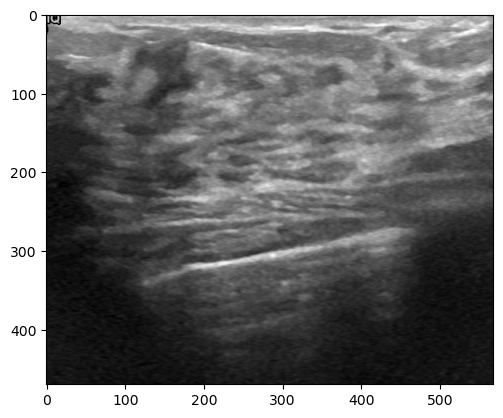

In [69]:
#show the image
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))#color convert code,because cv2 read BGR, matlib read rgb
plt.show()

In [8]:
#img1

In [70]:
# Print the statistics of img1, min= 0, max=255
img1_mean = np.mean(img1)
img1_median = np.median(img1)
img1_min = np.min(img1)
img1_max = np.max(img1)
img1_stddev = np.std(img1)

print(f"Mean: {img1_mean}")
print(f"Median: {img1_median}")
print(f"Minimum: {img1_min}")
print(f"Maximum: {img1_max}")
print(f"Standard Deviation: {img1_stddev}")

Mean: 83.68363425232245
Median: 79.0
Minimum: 0
Maximum: 255
Standard Deviation: 52.02492111679509


In [71]:
# find out the image file extensions.
data_dir = 'data'
unique_extensions = set() #set method to remove duplicates of image file extension

for image_class in os.listdir(data_dir):
    if image_class == ".DS_Store":
        continue  # Skip the .DS_Store file
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir, image_class, image)
        if os.path.isfile(image_path):
            _, extension = os.path.splitext(image)
            unique_extensions.add(extension)

print("Unique image file extensions:")
for extension in unique_extensions:
    print(extension)

Unique image file extensions:
.png


In [72]:
# find out the image file counts of each class
class_count = {} # difine a dictionary to hold image_class and counts

for image_class in os.listdir(data_dir):
    if image_class == ".DS_Store":
        continue  # Skip the .DS_Store file, the metadata file about the folders produced by iMac
    class_count[image_class] = 0  # Initialize count to 0 for each class
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir, image_class, image)
        if os.path.isfile(image_path):
            class_count[image_class] += 1

for image_class, count in class_count.items():
    print(f"{image_class}: {count} image files")

malignant: 210 image files
benign: 437 image files
normal: 133 image files


## Data Preparation and Visulization

Load data by function keras.utils.image_dataset_from_directory which automatically generate and one hot encode the labels based on the data data directory and resize the image (default 256,256)

In [73]:
data = tf.keras.utils.image_dataset_from_directory('data',batch_size=32,label_mode = 'categorical')
# data pipline, the data is on the air, not in the memory, good for large dataset

Found 780 files belonging to 3 classes.


In [13]:
len(data) 
# 25 batch

25

In [74]:
data_iterator = data.as_numpy_iterator()
# as_numpy_iterator() function returns an iterator which converts all elements of the dataset to numpy

In [16]:
data_iterator

In [75]:
batch = data_iterator.next()
# next() will return the next item in the iterator, so we can access the data

In [94]:
#len(batch)
# 2 means 2 parts, 1 is numpy array, 2 is the label

2

In [14]:
# images represented as numpy arrays, 32 batch size, 256 pexels, 3 color channels
batch[0].shape

(32, 256, 256, 3)

/Users/lieli/anaconda3/lib/python3.10/site-packages/matplotlib/text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


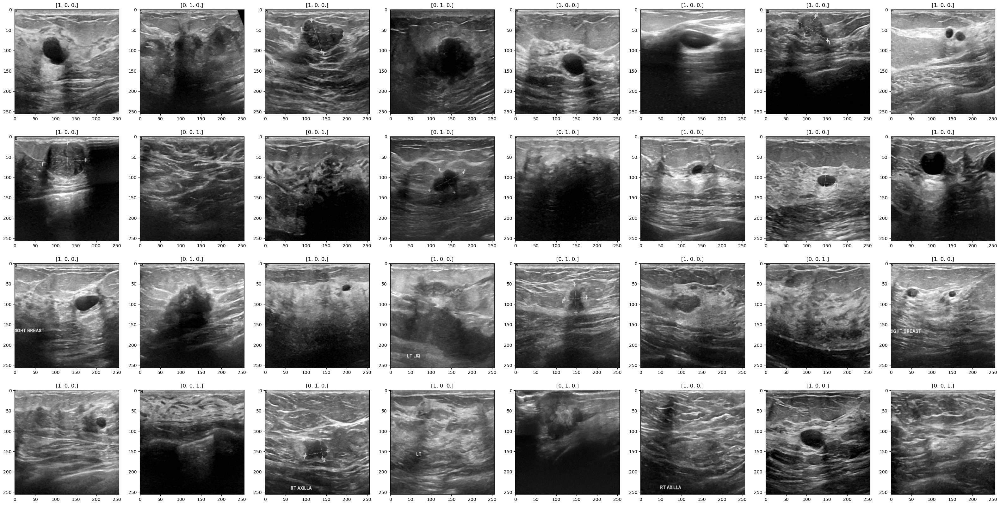

In [76]:
# Display some of the images and label: [1.0.0] Begign; [0.1.0] Malignant; [0.0.1] Normal to have some sense about the images
fig,ax = plt.subplots(4,8,figsize=(40,20))
for idx,img in enumerate(batch[0][:32]):
    ax[idx // 8, idx % 8].imshow(img.astype(int))
    ax[idx // 8, idx % 8].title.set_text(batch[1][idx])

## Build and train a 4-trainable layers CNN Model

In [77]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Conv2D, ReLU,Add,MaxPooling2D, Dense,Flatten,BatchNormalization,GlobalAveragePooling2D,Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall,CategoricalAccuracy,AUC
from sklearn.metrics import confusion_matrix

In [7]:
# batch[0].shape
# image

(32, 256, 256, 3)

Data Scaling

In [78]:
#Scale image values btw 0 to 1, instead of 0 to 255 which help our deep learning model generalize faster and produces better
scaled = data.map(lambda x,y: (x/255,y))

In [99]:
#batch = scaled.as_numpy_iterator().next()

In [18]:
len(data)

25

In [28]:
batch[1].shape
# image class

(32, 3)

Split data to training, validation and test datasets at the ratio 0.7, 0.2, 0.1 and leave the rest to test dataset.

In [79]:
train_size = int(len(scaled)*.7)
val_size = int(len(scaled)*.2)
test_size = int(len(scaled)*.1)+1

In [80]:
train = scaled.take(train_size)
val = scaled.skip(train_size).take(val_size)
test = scaled.skip(train_size+val_size).take(test_size)

In [81]:
print(len(train),len(val),len(test))

17 5 3


Build a CNN model

In [82]:
# 3 2d Convlution block and 1 Dense layer 
model0 = Sequential()

model0.add(Conv2D(16,(3,3),1, activation='relu',input_shape=(256,256,3))) # (16filter, size of the filter (3pixels size),stride(move 1pixel each time))
model0.add(MaxPooling2D()) # MasPooling take the max value for out put, feature extraction

model0.add(Conv2D(32,(3,3),1, activation='relu'))
model0.add(MaxPooling2D())

model0.add(Conv2D(16,(3,3),1, activation='relu'))
model0.add(MaxPooling2D())

model0.add(Flatten())

#model.add(Dense(256, activation='relu'))
model0.add(Dense(3, activation='softmax'))

In [83]:
# Model compile: optimizer, adam; 
optimizer = Adam(learning_rate=0.001)
model0.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

In [84]:
model0.summary() #4 trainable layers

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 127, 127, 16)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 30, 30, 16)      

Train the full data set by the Sequential CNN model

In [85]:
# Train the model
hist = model0.fit(train, epochs=30,validation_data=val)

Epoch 1/30
17/17 [==============================] - 17s 897ms/step - loss: 0.9681 - categorical_accuracy: 0.5533 - val_loss: 1.1384 - val_categorical_accuracy: 0.5000
Epoch 2/30
17/17 [==============================] - 17s 929ms/step - loss: 0.9455 - categorical_accuracy: 0.5680 - val_loss: 0.9065 - val_categorical_accuracy: 0.5750
Epoch 3/30
17/17 [==============================] - 15s 851ms/step - loss: 0.8508 - categorical_accuracy: 0.6397 - val_loss: 0.7586 - val_categorical_accuracy: 0.6812
Epoch 4/30
17/17 [==============================] - 15s 825ms/step - loss: 0.7650 - categorical_accuracy: 0.6507 - val_loss: 0.7628 - val_categorical_accuracy: 0.6313
Epoch 5/30
17/17 [==============================] - 15s 870ms/step - loss: 0.6721 - categorical_accuracy: 0.7114 - val_loss: 0.7177 - val_categorical_accuracy: 0.6875
Epoch 6/30
17/17 [==============================] - 16s 929ms/step - loss: 0.6068 - categorical_accuracy: 0.7426 - val_loss: 0.5516 - val_categorical_accuracy: 0.768

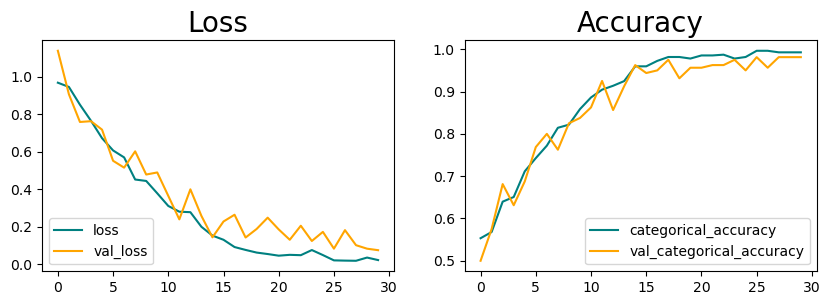

In [86]:
# Create a scatter plot for the Loss and Accuracy across the training process
fig,ax = plt.subplots(1,2,figsize=(10,3))
ax[0].plot(hist.history['loss'],color='teal',label='loss')
ax[0].plot(hist.history['val_loss'],color='orange',label='val_loss')
ax[0].set_title('Loss',fontsize=20)
ax[0].legend(loc='lower left')

ax[1].plot(hist.history['categorical_accuracy'],color='teal',label='categorical_accuracy')
ax[1].plot(hist.history['val_categorical_accuracy'],color='orange',label='val_categorical_accuracy')
ax[1].set_title('Accuracy',fontsize=20)
ax[1].legend(loc='lower right')
plt.show()

## Random search to find the best model

In [90]:
from kerastuner import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau

/var/folders/sd/k9_52qs55_q1466rw2ts01480000gq/T/ipykernel_194/3332744356.py:1: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner import RandomSearch


In [38]:
def build_model(hp):
  model = keras.Sequential([
    keras.layers.Conv2D(
        filters=hp.Int('conv_1_filter', min_value=32, max_value=128, step=16),
        kernel_size=hp.Choice('conv_1_kernel', values = [3,3]),
        strides=hp.Choice('conv_1_strides', values=[1, 1]),
        activation='relu',
        input_shape=(256,256,3)
    ),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(
        filters=hp.Int('conv_2_filter', min_value=32, max_value=64, step=16),
        kernel_size=hp.Choice('conv_2_kernel', values = [3,3]),
        strides=hp.Choice('conv_2_strides', values=[1, 1]),
        activation='relu'
    ),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(
        filters=hp.Int('conv_3_filter', min_value=32, max_value=64, step=16),
        kernel_size=hp.Choice('conv_3_kernel', values = [3,3]),
        strides=hp.Choice('conv_3_strides', values=[1, 1]),
        activation='relu'
    ),
    keras.layers.MaxPooling2D(),
    keras.layers.Flatten(),
    keras.layers.Dense(3, activation='softmax')
  ])

  model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-4])),
              loss='categorical_crossentropy',
              metrics=['categorical_accuracy'],)

  return model

In [39]:
tuner_search=RandomSearch(build_model,
                          objective='val_categorical_accuracy',
                          max_trials=5,directory='output2',project_name="BreastMassClassifier2")

INFO:tensorflow:Reloading Tuner from output2/BreastMassClassifier2/tuner0.json


In [40]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [41]:
tuner_search.search(train,epochs=30,validation_data=val,callbacks=[early_stopping]) # total took 8h 36m

Trial 5 Complete [07h 59m 09s]
val_categorical_accuracy: 0.9624999761581421

Best val_categorical_accuracy So Far: 0.9624999761581421
Total elapsed time: 08h 36m 07s
INFO:tensorflow:Oracle triggered exit


In [42]:
model=tuner_search.get_best_models(num_models=1)[0]

In [55]:
best_hyperparameters = tuner_search.get_best_hyperparameters(num_trials=1)[0]
print(best_hyperparameters.values)

{'conv_1_filter': 112, 'conv_1_kernel': 3, 'conv_1_strides': 1, 'conv_2_filter': 64, 'conv_2_kernel': 3, 'conv_2_strides': 1, 'conv_3_filter': 64, 'conv_3_kernel': 3, 'conv_3_strides': 1, 'learning_rate': 0.0001}


In [49]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 112)     3136      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 112)    0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      64576     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 64)       0

In [45]:
hist2b=model.fit(train, epochs=300, validation_data=val, initial_epoch=30,callbacks=[early_stopping])

Epoch 31/300
17/17 [==============================] - 50s 3s/step - loss: 0.0667 - categorical_accuracy: 0.9835 - val_loss: 0.0984 - val_categorical_accuracy: 0.9688
Epoch 32/300
17/17 [==============================] - 50s 3s/step - loss: 0.0499 - categorical_accuracy: 0.9926 - val_loss: 0.0995 - val_categorical_accuracy: 0.9563
Epoch 33/300
17/17 [==============================] - 50s 3s/step - loss: 0.0454 - categorical_accuracy: 0.9908 - val_loss: 0.1070 - val_categorical_accuracy: 0.9563
Epoch 34/300
17/17 [==============================] - 49s 3s/step - loss: 0.0592 - categorical_accuracy: 0.9853 - val_loss: 0.1278 - val_categorical_accuracy: 0.9563
Epoch 35/300
17/17 [==============================] - 51s 3s/step - loss: 0.0588 - categorical_accuracy: 0.9871 - val_loss: 0.0704 - val_categorical_accuracy: 0.9875
Epoch 36/300
17/17 [==============================] - 53s 3s/step - loss: 0.0522 - categorical_accuracy: 0.9908 - val_loss: 0.0951 - val_categorical_accuracy: 0.9563
Epoc

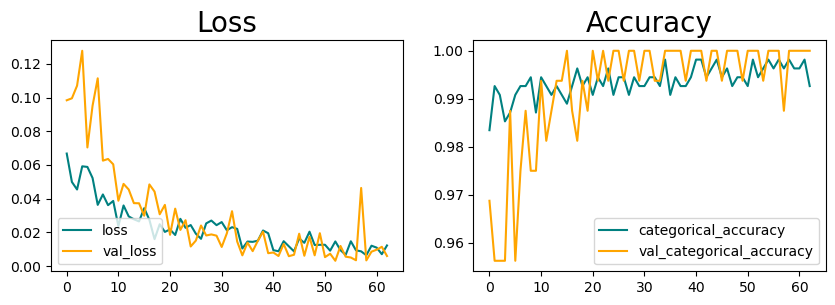

In [46]:
fig,ax = plt.subplots(1,2,figsize=(10,3))
ax[0].plot(hist2b.history['loss'],color='teal',label='loss')
ax[0].plot(hist2b.history['val_loss'],color='orange',label='val_loss')
ax[0].set_title('Loss',fontsize=20)
ax[0].legend(loc='lower left')

ax[1].plot(hist2b.history['categorical_accuracy'],color='teal',label='categorical_accuracy')
ax[1].plot(hist2b.history['val_categorical_accuracy'],color='orange',label='val_categorical_accuracy')
ax[1].set_title('Accuracy',fontsize=20)
ax[1].legend(loc='lower right')
plt.show()

## Model Evaluation
Use the test dataset to evaluate the model performance by precision,recall,accuracy,AUC, cofusion_matrix

In [37]:
pre = Precision()
re = Recall()
acc = CategoricalAccuracy()
auc = AUC()

In [38]:
for batch in test.as_numpy_iterator():
    X, y = batch
    y_pred = model.predict(X)
    pre.update_state(y, y_pred)
    re.update_state(y, y_pred)
    acc.update_state(y, y_pred)
    auc.update_state(y,y_pred)

1/1 [==============================] - 0s 130ms/step


In [39]:
print(f'Precision:{pre.result().numpy()}, Recall:{re.result().numpy()},Accuracy:{acc.result().numpy()},AUC:{auc.result().numpy()}')

Precision:0.9605262875556946, Recall:0.9605262875556946,Accuracy:0.9605262875556946,AUC:0.991992712020874


In [59]:
true_labels = []
predicted_labels = []

# Iterate through the test dataset and collect true and predicted labels
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)
    
    true_labels.extend(np.argmax(y, axis=1))  # Assuming 'y' is one-hot encoded
    predicted_labels.extend(np.argmax(yhat, axis=1))

# Create a confusion matrix
confusion = confusion_matrix(true_labels, predicted_labels)

# Print or use the confusion matrix as needed
print(confusion)

1/1 [==============================] - 0s 284ms/step
[[37  0  0]
 [ 0 21  0]
 [ 0  0 18]]


## Save the best Model

In [61]:
model.save(os.path.join('691','BreastCancerDetection.h5'))# used for flask web app

## Use UMAP and TSNE for further Data Visulization

In [6]:
import umap.umap_ as umap
from sklearn.decomposition import PCA

/Users/lieli/anaconda3/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/lieli/anaconda3/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/lieli/anaconda3/lib/python3.10/site-packages/umap/distances.py:1086: NumbaDeprecationWa

In [3]:
data = tf.keras.utils.image_dataset_from_directory('data',batch_size=32,label_mode = 'categorical')

Found 780 files belonging to 3 classes.


In [4]:
# image reshape and scale
images = np.concatenate([x for x, _ in data], axis=0)/255.0
images_flattened = images.reshape(images.shape[0], -1)

In [24]:
# Apply UMAP to reduce the dimensionality of the image data
umap_model2D = umap.UMAP(n_components = 2,n_neighbors=10, min_dist=0.0,random_state=42)  
umap2D_result = umap_model2D.fit_transform(images_flattened)

In [9]:
# extract class_labels, np.argmax Returns the indices of the maximum values along an axis
class_labels_flatten = np.concatenate([y for _,y  in data], axis=0)
class_labels=np.argmax(class_labels_flatten, axis=1)

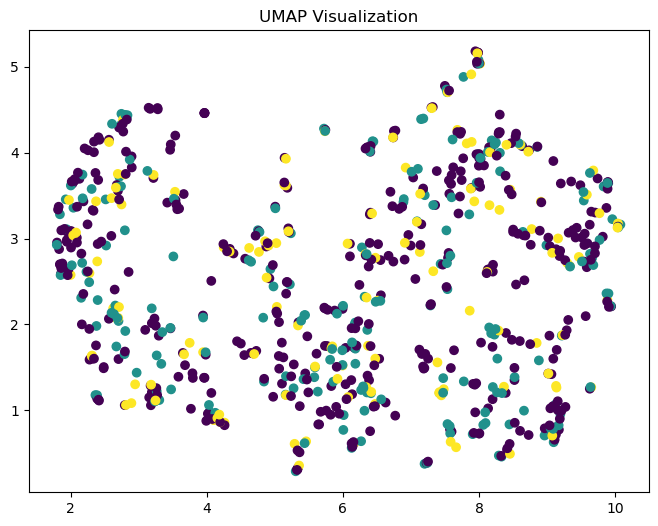

In [25]:
# Plot the results
plt.figure(figsize=(8, 6))
plt.scatter(umap2D_result[:, 0], umap2D_result[:, 1], c=class_labels)  # c= contains class labels

plt.title("UMAP Visualization")
plt.show()

In [31]:
np.unique(class_labels) #[1.0.0] Begign; [0.1.0] Malignant; [0.0.1] Normal so 0 is Begign, 1 is Malignant, 2 is Normal

array([0, 1, 2])

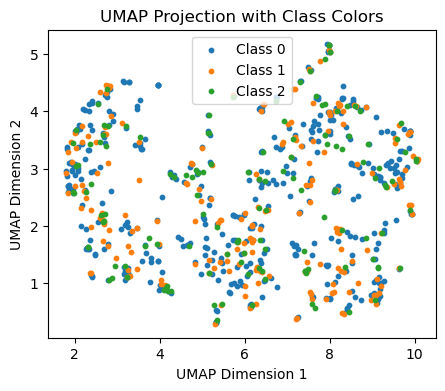

In [26]:
# Create a umap scatter plot 
plt.figure(figsize=(5,4))

# Iterate through unique class labels and plot them with distinct colors
unique_classes = np.unique(class_labels)
for class_label in unique_classes:
    # Filter UMAP embeddings for points with the current class label
    points = umap2D_result[class_labels == class_label]
    
    # Plot the points with the corresponding color
    plt.scatter(points[:, 0], points[:, 1], s=10, label=f'Class {class_label}')

plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP Projection with Class Colors')
plt.legend()

# Show the plot
plt.show()

In [27]:
# define a function to Visulize umap for different hyperparameters
def draw_umap(n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(images_flattened);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=class_labels)
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=class_labels)
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=class_labels, s=100)
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
    plt.title(title, fontsize=18)

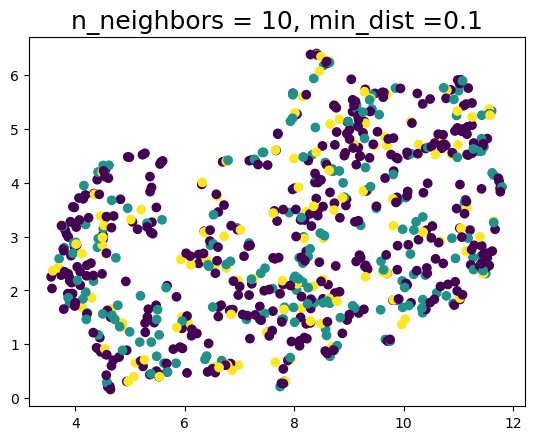

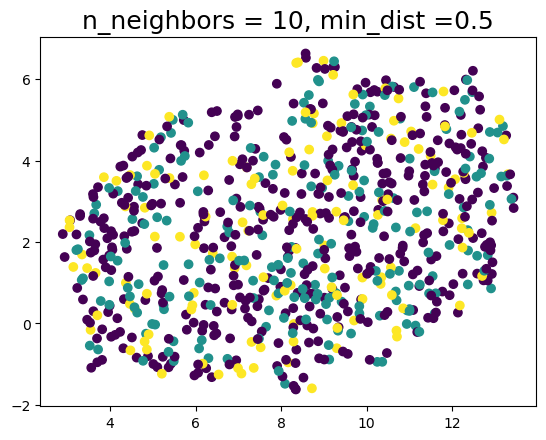

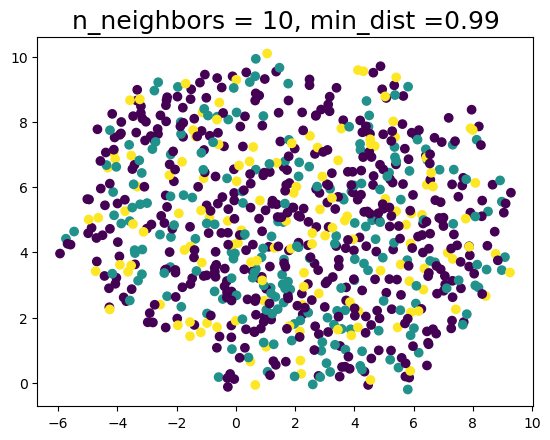

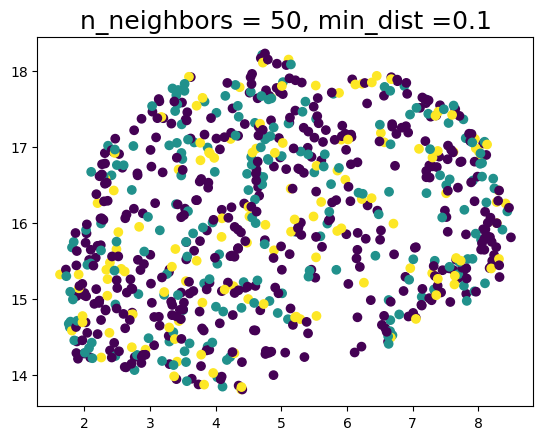

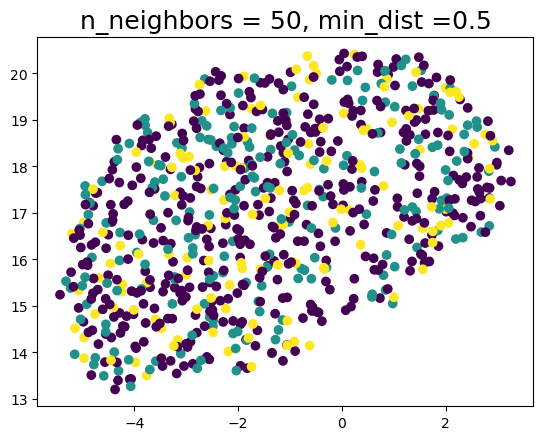

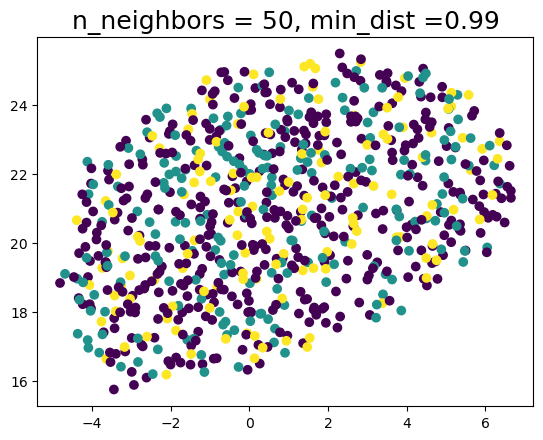

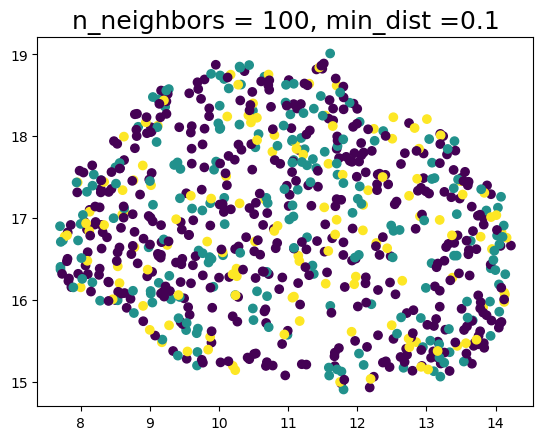

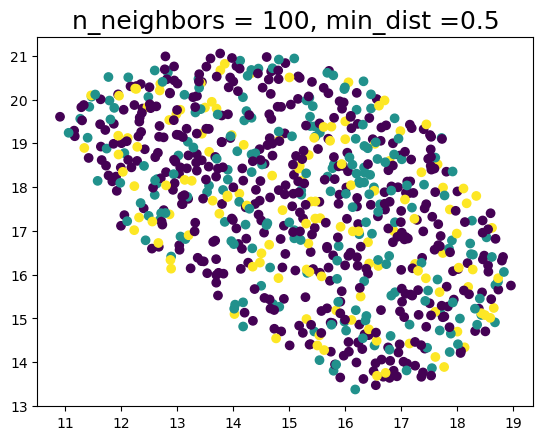

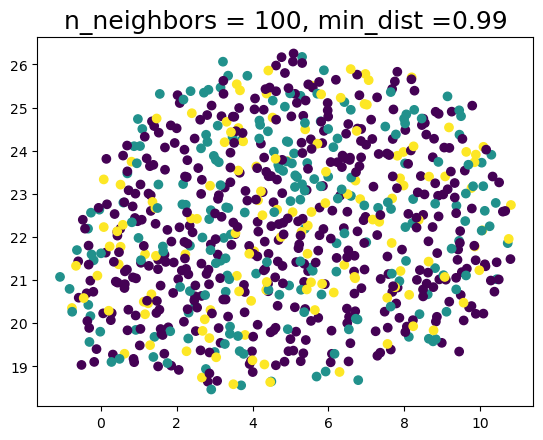

In [34]:
# Hyperparamer tuning
for n in (10, 50, 100):
    for d in (0.1, 0.5, 0.99):
         draw_umap(n_neighbors=n, min_dist=d, title='n_neighbors = {}, min_dist ={}'.format(n,d))

In [15]:
from sklearn.manifold import TSNE

# Initialize the t-SNE model
tsne = TSNE(n_components=2, perplexity=50, n_iter=5000, random_state=42)

# Fit and transform the data to lower dimensions (2D)
X_embedded = tsne.fit_transform(images_flattened)

/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


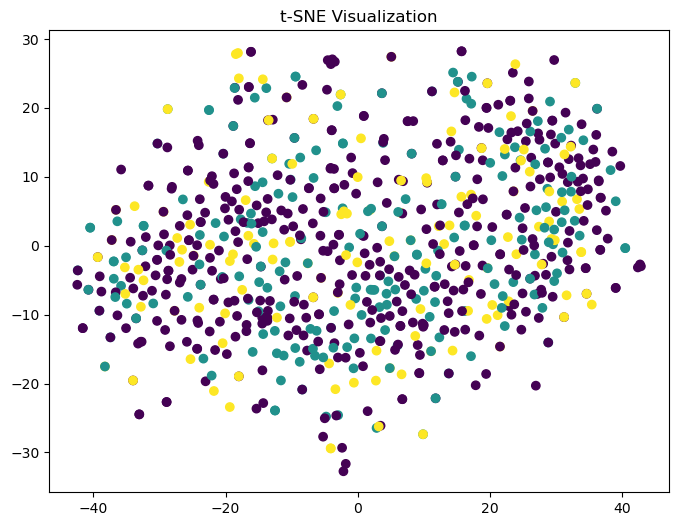

In [16]:
# Plot the results
plt.figure(figsize=(8, 6))
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=class_labels,label=f'Class {class_labels}')  # c= contains class labels

plt.title("t-SNE Visualization")
plt.show()

In [35]:
from sklearn.manifold import TSNE

def draw_tsne(perplexity=20, n_iter=3000, n_components=2, title=''):
    fit = TSNE(
        perplexity=perplexity,
        n_iter=n_iter,
        n_components=n_components,
    )
    t = fit.fit_transform(images_flattened);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(t[:,0], range(len(t)), c=class_labels)
        ax.set_xlabel('tsne 1')
        ax.set_ylabel('tsne 2')
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(t[:,0], t[:,1], c=class_labels)
        ax.set_xlabel('tsne 1')
        ax.set_ylabel('tsne 2')
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(t[:,0], u[:,1], t[:,2], c=class_labels, s=100)
        ax.set_xlabel('tsne 1')
        ax.set_ylabel('tsne 2')
    plt.title(title, fontsize=18)

/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.1

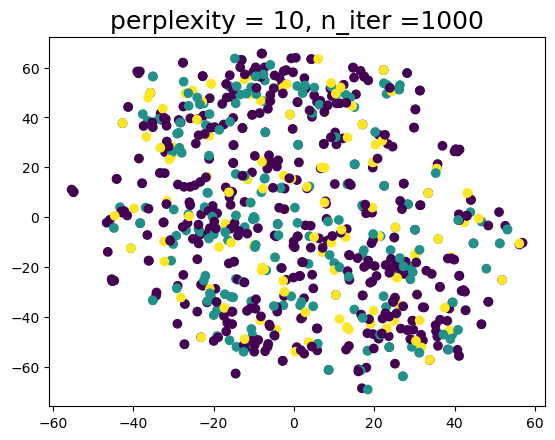

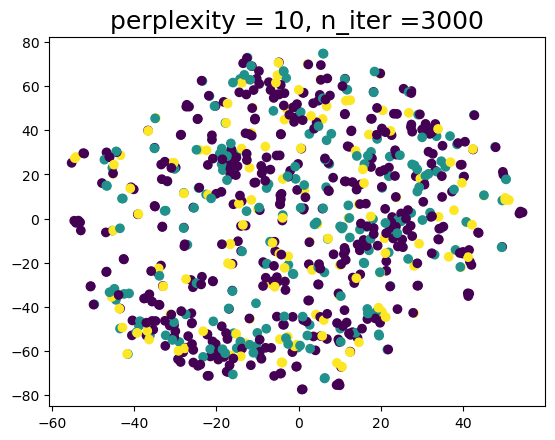

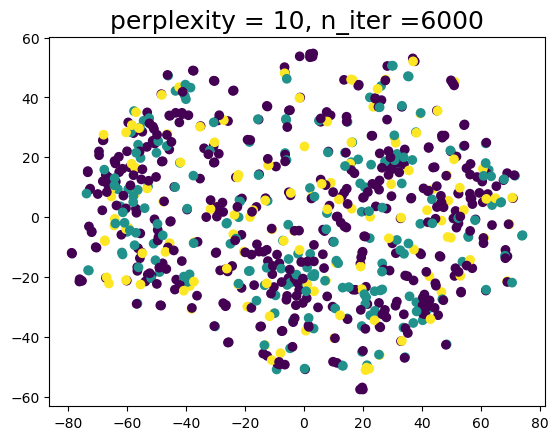

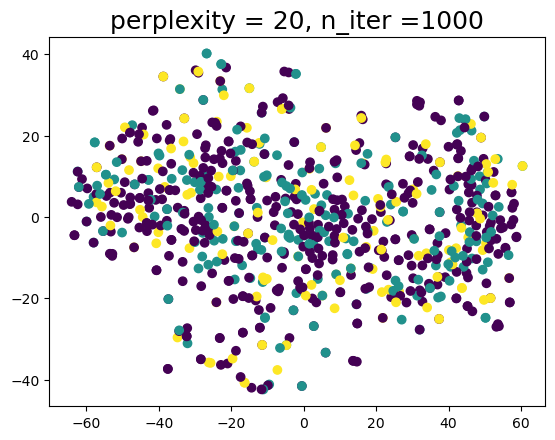

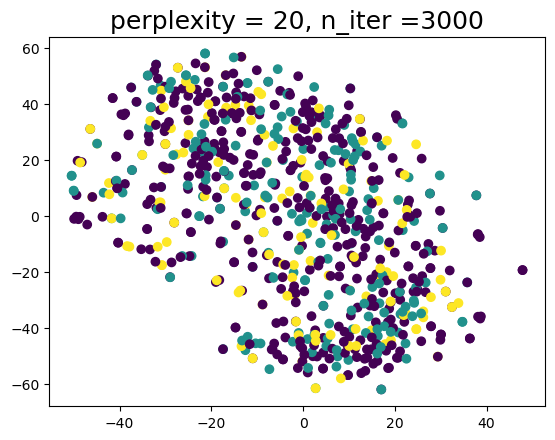

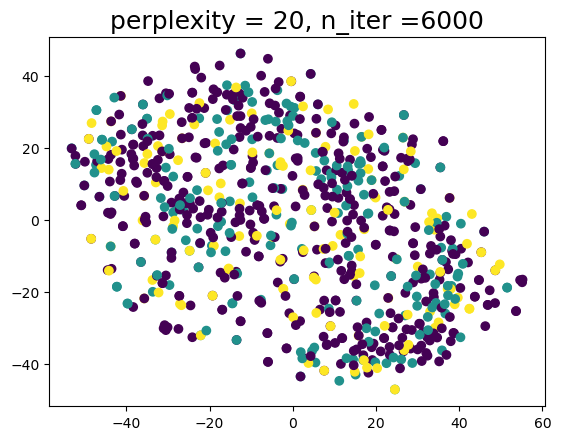

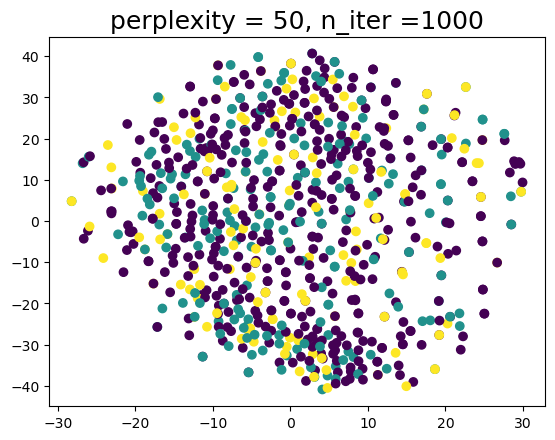

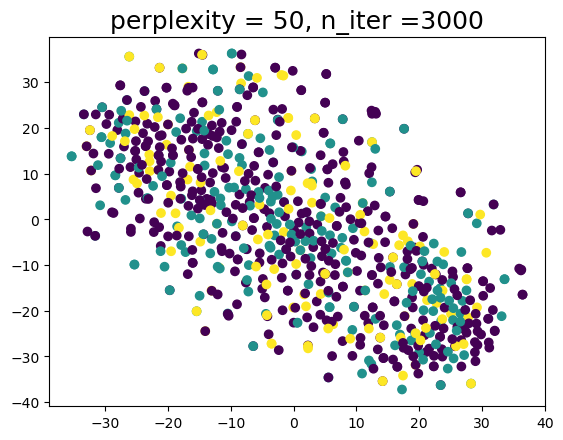

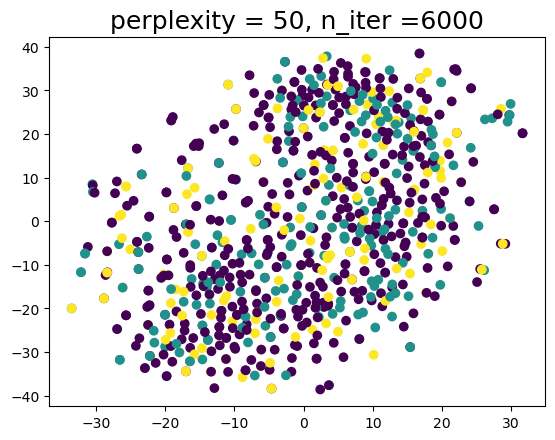

In [36]:
for p in (10,20,50):
    for n in (1000, 3000, 6000):
         draw_tsne(perplexity=p, n_iter=n , title='perplexity = {}, n_iter ={}'.format(p,n))

In [95]:
# Apply UMAP to reduce the dimensionality to 3
umap_model3D = umap.UMAP(n_components=3,n_neighbors=120, min_dist=0.5)  

In [36]:
umap3D_result = umap_model3D.fit_transform(images_flattened)

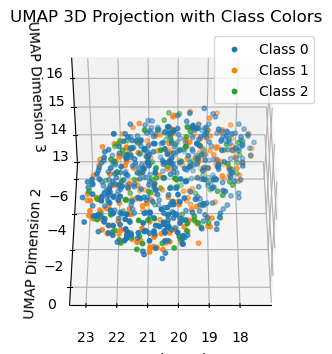

In [37]:
from mpl_toolkits.mplot3d import Axes3D  # Import 3D plotting toolkit

# Create a 3D figure
fig = plt.figure(figsize=(4,5))
ax = fig.add_subplot(111, projection='3d')

# Iterate through unique class labels and plot them with distinct colors
for class_label in unique_classes:
    # Filter UMAP embeddings for points with the current class label
    points = umap3D_result[class_labels == class_label]
    
    # Plot the points with the corresponding color
    ax.scatter(points[:, 0], points[:, 1], points[:, 2], s=10, label=f'Class {class_label}')

# Customize plot attributes (labels, title, legend, etc.)
ax.set_xlabel('UMAP Dimension 1')
ax.set_ylabel('UMAP Dimension 2')
ax.set_zlabel('UMAP Dimension 3')  # Set the z-label here

ax.set_title('UMAP 3D Projection with Class Colors')
ax.legend()
ax.view_init(elev=45, azim=90)
# Show the 3D plot
plt.show()


# PCA dimension reduction.

PCA may not be a good technique for this image dataset to do dimension reduction comparing to UMAP and tsne which are capable of capturing complex, nonlinear relationships in the data and can reserve the spatial information of the image data.

In [40]:
# initiate a class for PCA
pca = PCA(n_components=0.95)#try 0.95
# got the reduced data by fit_transform method
image_reduced = pca.fit_transform(images_flattened)
# compute the dimension numbers after reduded
pca.n_components_

366

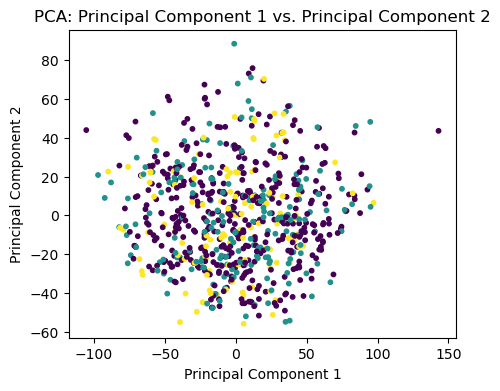

In [97]:
# Create a scatter plot for the first two principal components
plt.figure(figsize=(5,4))
plt.scatter(image_reduced[:, 0], image_reduced[:, 1], c=class_labels, s=10)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: Principal Component 1 vs. Principal Component 2')
plt.show()

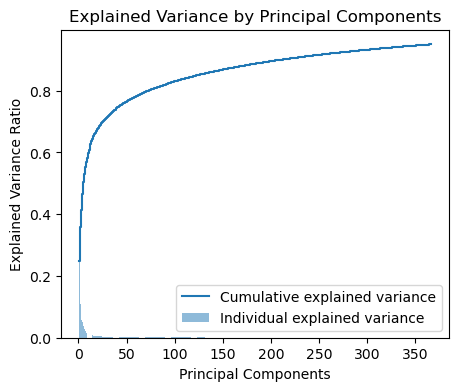

In [124]:
# Create a scree plot to visualize explained variance by each component
explained_variance = pca.explained_variance_ratio_
cumulative_explained_variance = explained_variance.cumsum()

plt.figure(figsize=(5,4))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(1, len(explained_variance) + 1), cumulative_explained_variance, where='mid', label='Cumulative explained variance')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.legend()
plt.show()

In [43]:
# define a function to Visulize umap for different hyperparameters
def draw_umap(n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(image_reduced);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=class_labels)
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=class_labels)
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=class_labels, s=100)
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
    plt.title(title, fontsize=18)

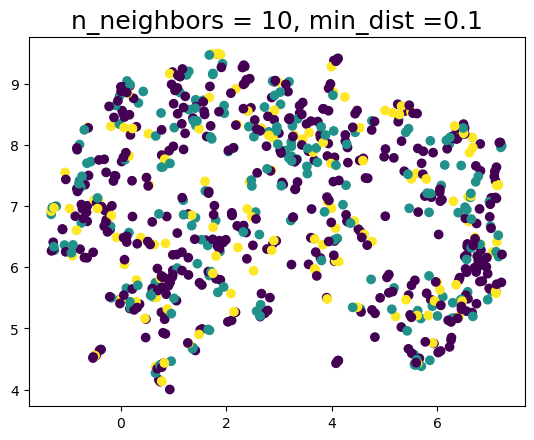

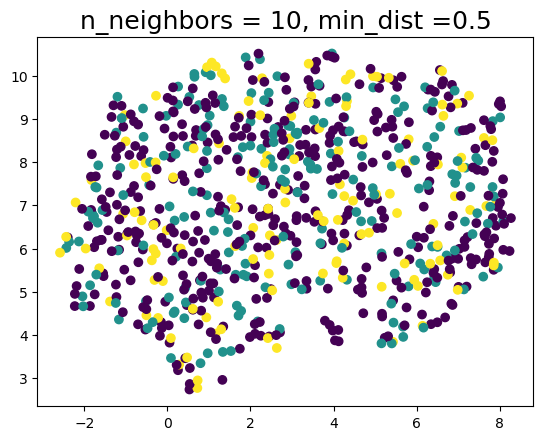

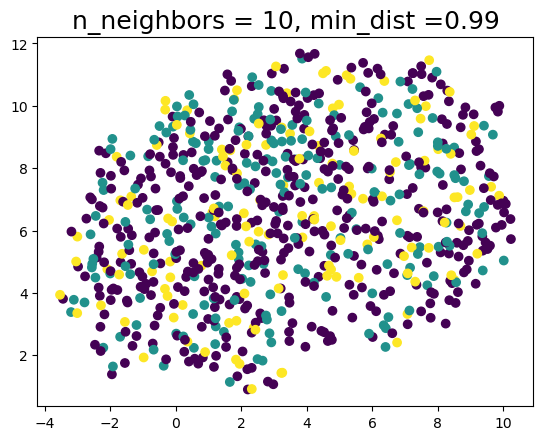

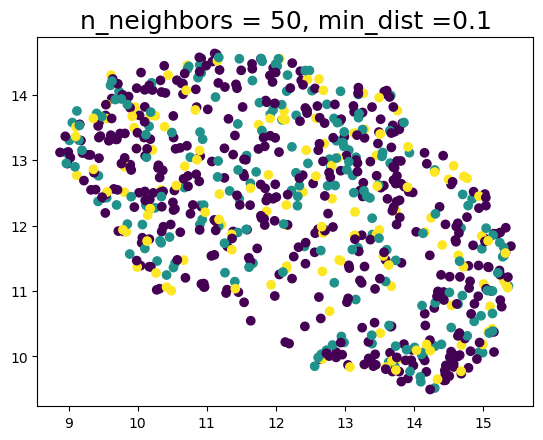

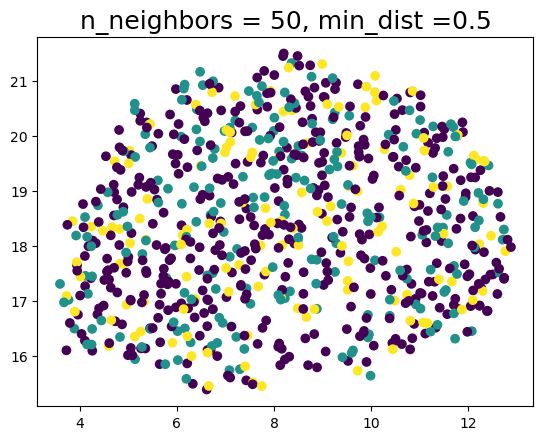

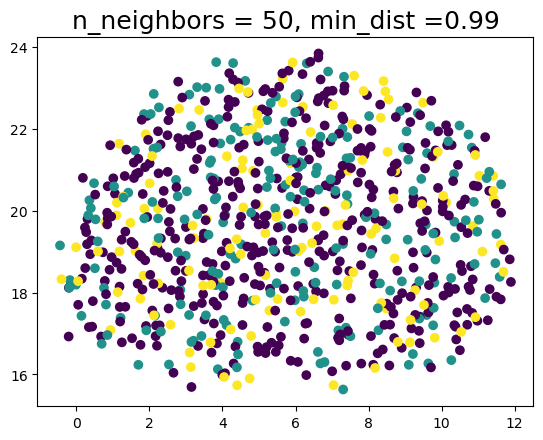

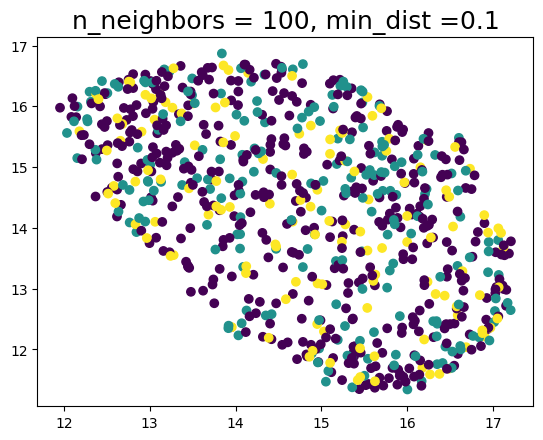

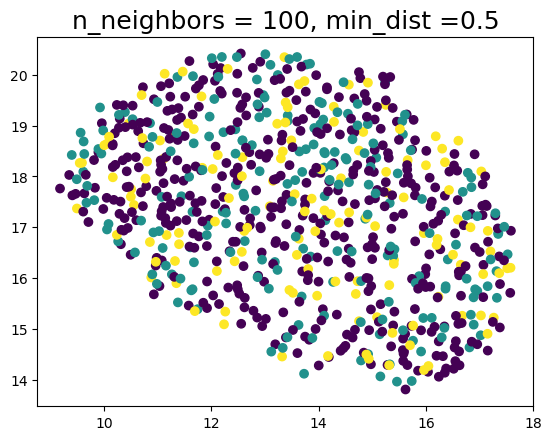

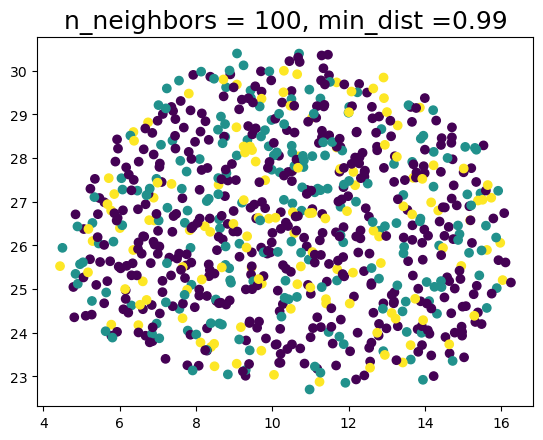

In [44]:
for n in (10, 50, 100):
    for d in (0.1, 0.5, 0.99):
         draw_umap(n_neighbors=n, min_dist=d, title='n_neighbors = {}, min_dist ={}'.format(n,d))

In [98]:
# Apply UMAP to PCA reduced image data
umap_model2D = umap.UMAP(n_components=2,n_neighbors=120, min_dist=0.5) 
umap2D_result = umap_model2D.fit_transform(image_reduced)

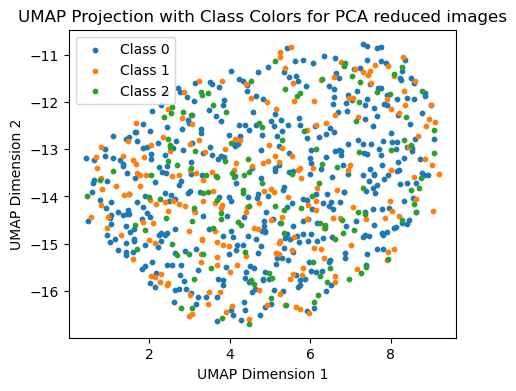

In [99]:
# Create a umap scatter plot
plt.figure(figsize=(5,4))

# Iterate through unique class labels and plot them with distinct colors
unique_classes = np.unique(class_labels)
for class_label in unique_classes:
    # Filter UMAP embeddings for points with the current class label
    points = umap2D_result[class_labels == class_label]
    
    # Plot the points with the corresponding color
    plt.scatter(points[:, 0], points[:, 1], s=10, label=f'Class {class_label}')

plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP Projection with Class Colors for PCA reduced images')

plt.legend()

# Show the plot
plt.show()

In [45]:
from sklearn.manifold import TSNE

def draw_tsne(perplexity=20, n_iter=3000, n_components=2, title=''):
    fit = TSNE(
        perplexity=perplexity,
        n_iter=n_iter,
        n_components=n_components,
    )
    t = fit.fit_transform(image_reduced);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(t[:,0], range(len(t)), c=class_labels)
        ax.set_xlabel('tsne 1')
        ax.set_ylabel('tsne 2')
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(t[:,0], t[:,1], c=class_labels)
        ax.set_xlabel('tsne 1')
        ax.set_ylabel('tsne 2')
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(t[:,0], u[:,1], t[:,2], c=class_labels, s=100)
        ax.set_xlabel('tsne 1')
        ax.set_ylabel('tsne 2')
    plt.title(title, fontsize=18)

/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.1

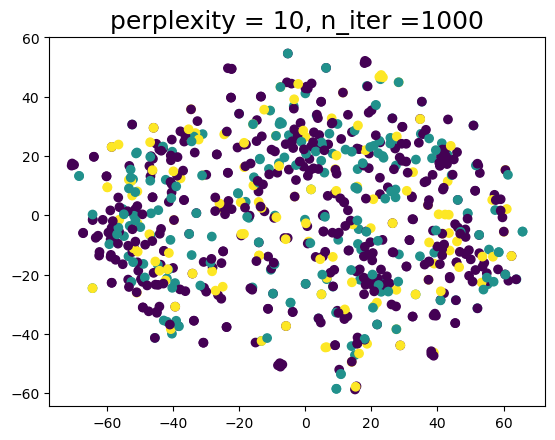

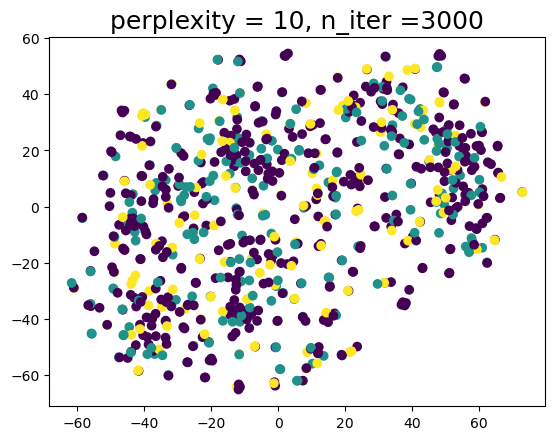

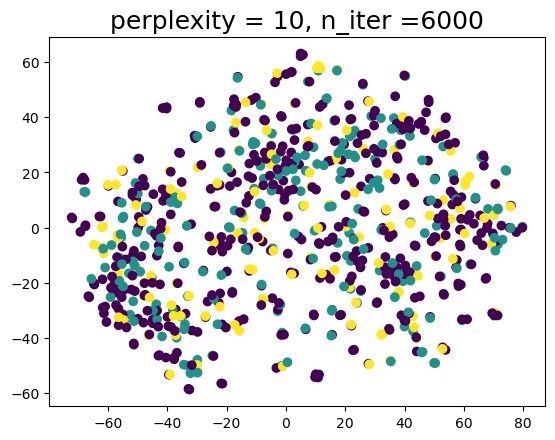

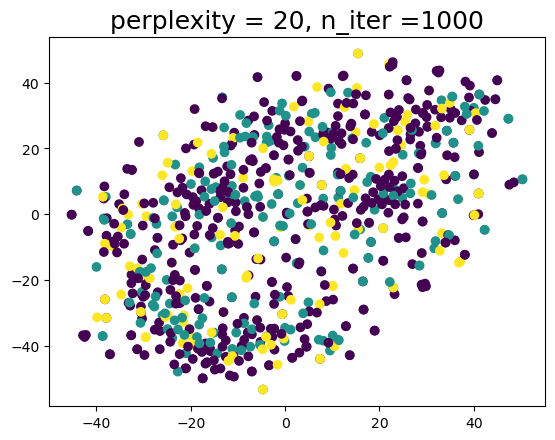

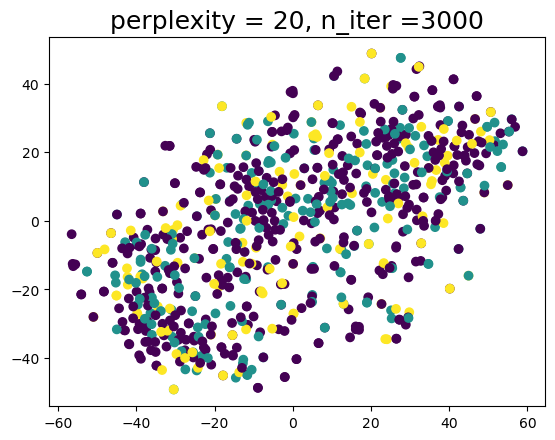

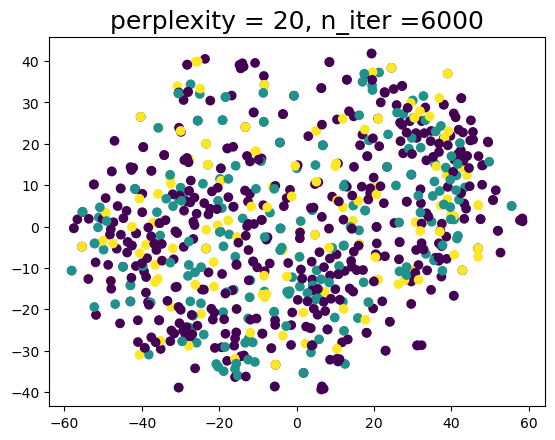

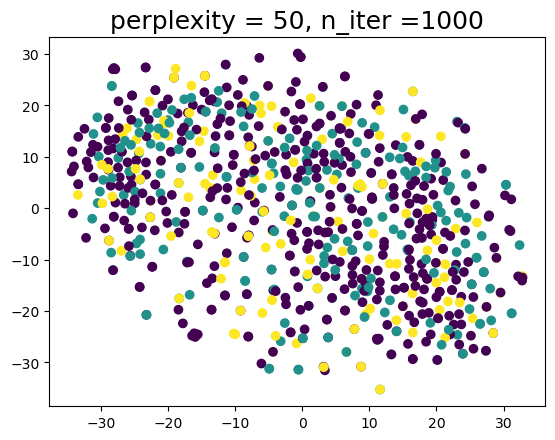

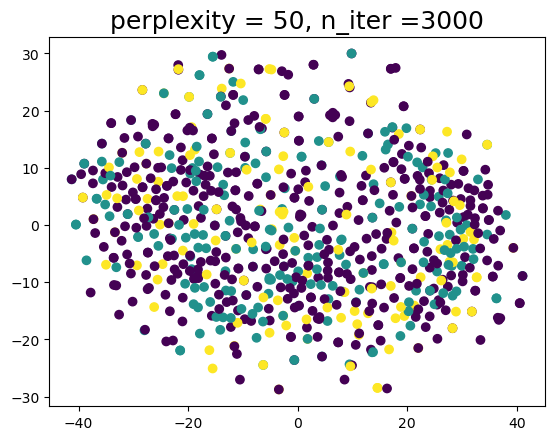

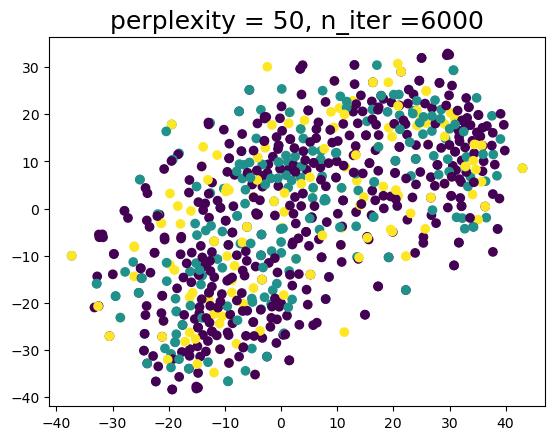

In [46]:
for p in (10,20,50):
    for n in (1000, 3000, 6000):
         draw_tsne(perplexity=p, n_iter=n , title='perplexity = {}, n_iter ={}'.format(p,n))

# Feature Extraction by Resnet50

In [47]:
from tensorflow.keras.applications import ResNet50

In [48]:
images = np.concatenate([x for x, _ in data], axis=0)

In [49]:
# Create a ResNet-50 model 
base_model = ResNet50(include_top=False, weights='imagenet', pooling='max', input_shape=(256, 256, 3))  
for layer in base_model.layers[:165]:
    layer.trainable = False # freeze the 165 close to the top layer weights
for layer in base_model.layers[165:]:
    layer.trainable = True # fine-tune the rest of layers

# Extract features using ResNet-50
features = base_model.predict(images)

25/25 [==============================] - 57s 2s/step


In [72]:
#features.shape

(780, 8, 8, 2048)

Apply UMAP to the extracted features

In [50]:
flattened_features = features.reshape((len(features), -1)) # Flatten the feature vectors
class_labels = np.concatenate([y for _,y  in data], axis=0)
class_labels=np.argmax(class_labels, axis=1)

In [51]:
# Scale the feature vectors
scaled_features = flattened_features/255.0

# Apply UMAP for extracted features
umap_model = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1)
umap_result = umap_model.fit_transform(scaled_features)

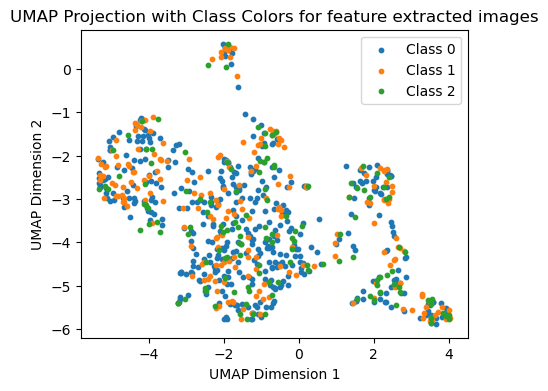

In [47]:
# Create a umap scatter plot with colored points based on class labels
plt.figure(figsize=(5,4))

# Iterate through unique class labels and plot them with distinct colors
unique_classes = np.unique(class_labels)
for class_label in unique_classes:
    # Filter UMAP embeddings for points with the current class label
    points = umap_result[class_labels == class_label]
    
    # Plot the points with the corresponding color
    plt.scatter(points[:, 0], points[:, 1], s=10, label=f'Class {class_label}')

# Customize plot attributes (labels, title, color bar, etc.)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP Projection with Class Colors for feature extracted images')

plt.legend()

# Show the plot
plt.show()

In [52]:
def draw_umap(n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(scaled_features);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=class_labels)
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=class_labels)
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=class_labels, s=100)
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
    plt.title(title, fontsize=18)

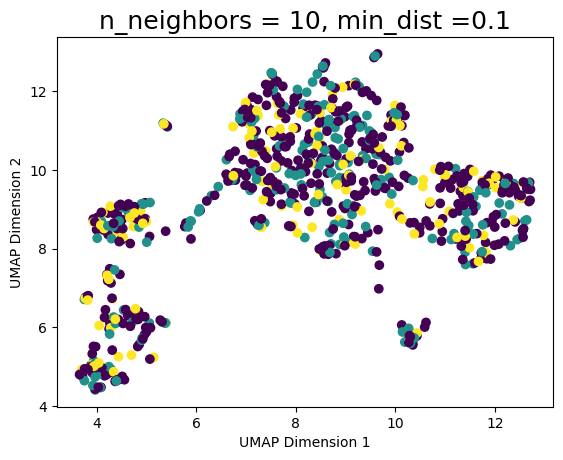

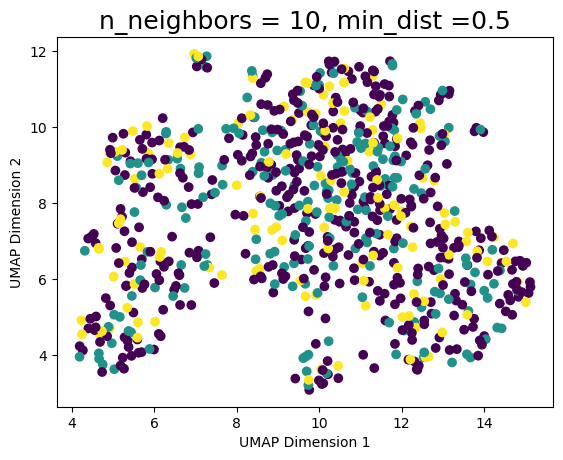

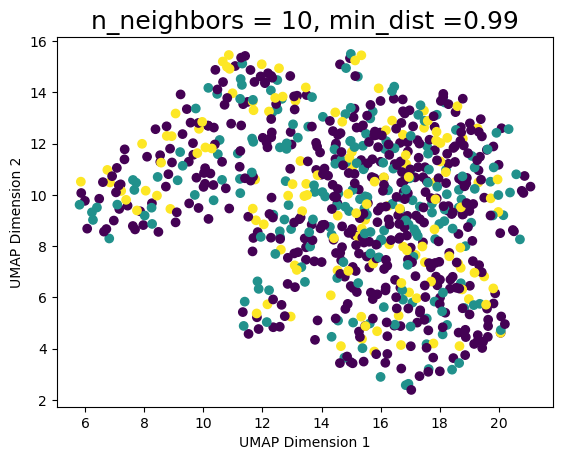

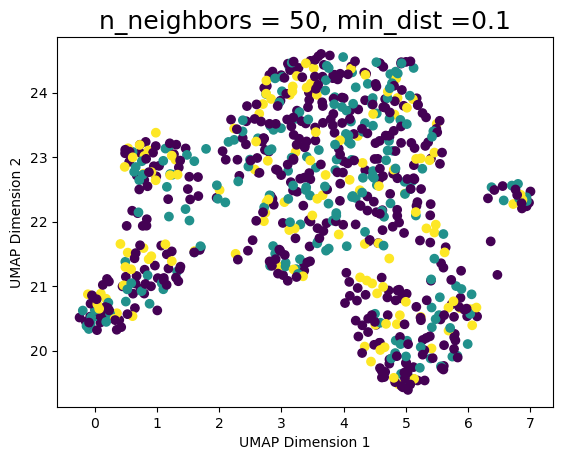

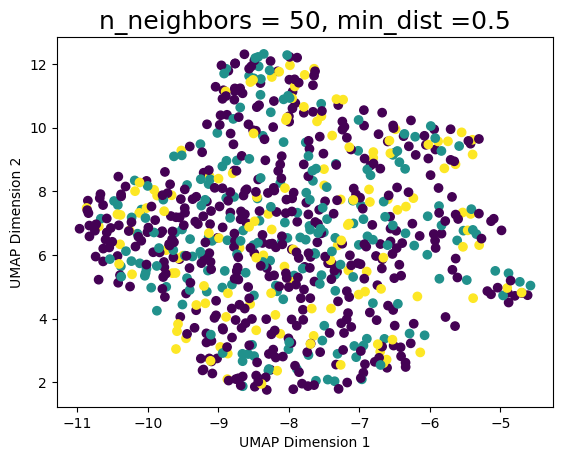

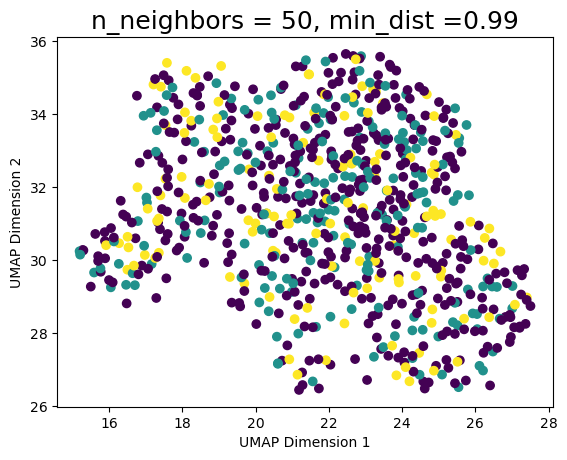

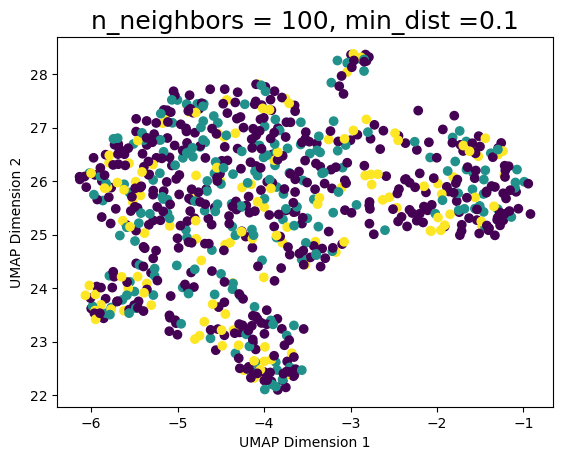

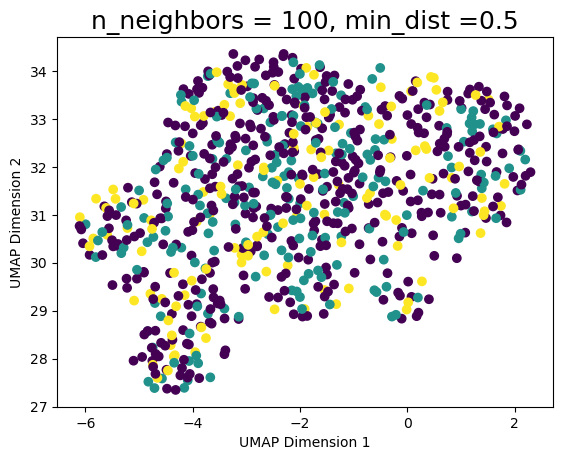

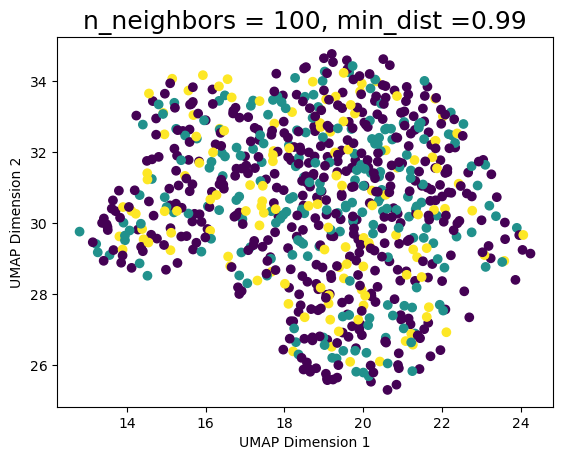

In [53]:
for n in (10, 50, 100):
    for d in (0.1, 0.5, 0.99):
         draw_umap(n_neighbors=n, min_dist=d, title='n_neighbors = {}, min_dist ={}'.format(n,d))

In [54]:
def draw_tsne(perplexity=20, n_iter=3000, n_components=2, title=''):
    fit = TSNE(
        perplexity=perplexity,
        n_iter=n_iter,
        n_components=n_components,
    )
    t = fit.fit_transform(scaled_features);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(t[:,0], range(len(t)), c=class_labels)
        ax.set_xlabel('tsne 1')
        ax.set_ylabel('tsne 2')
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(t[:,0], t[:,1], c=class_labels)
        ax.set_xlabel('tsne 1')
        ax.set_ylabel('tsne 2')
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(t[:,0], u[:,1], t[:,2], c=class_labels, s=100)
        ax.set_xlabel('tsne 1')
        ax.set_ylabel('tsne 2')
    plt.title(title, fontsize=18)

/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lieli/anaconda3/lib/python3.1

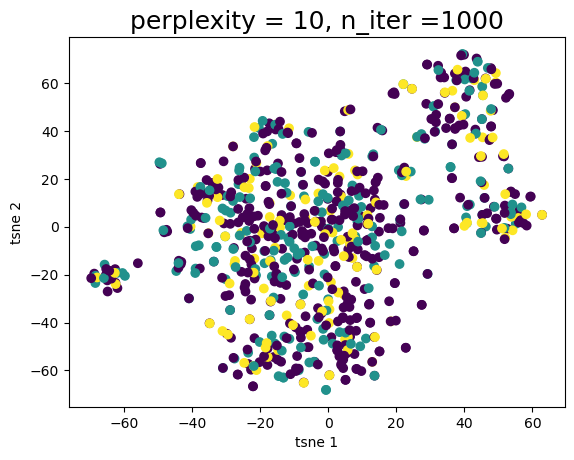

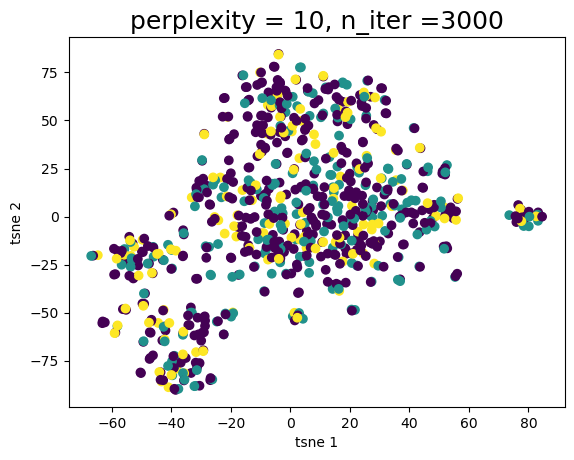

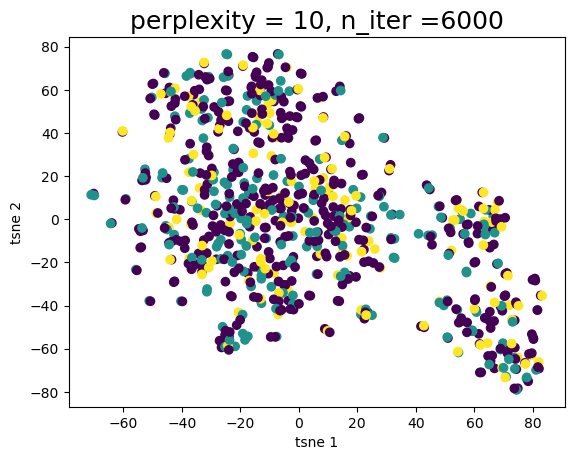

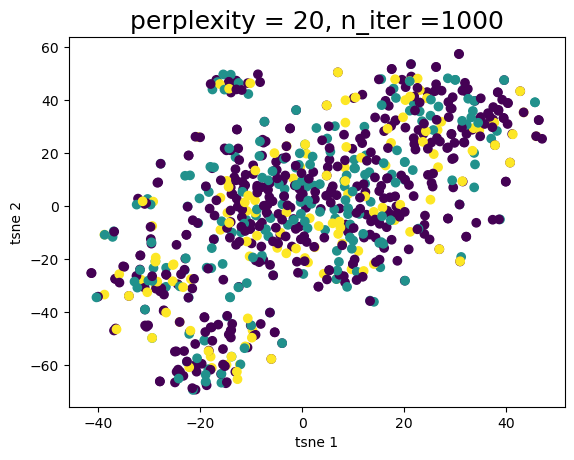

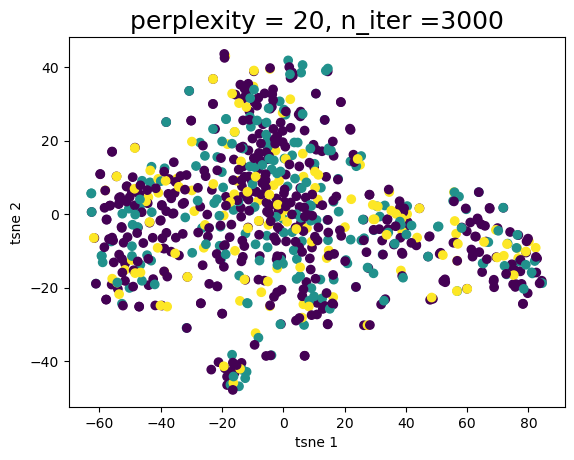

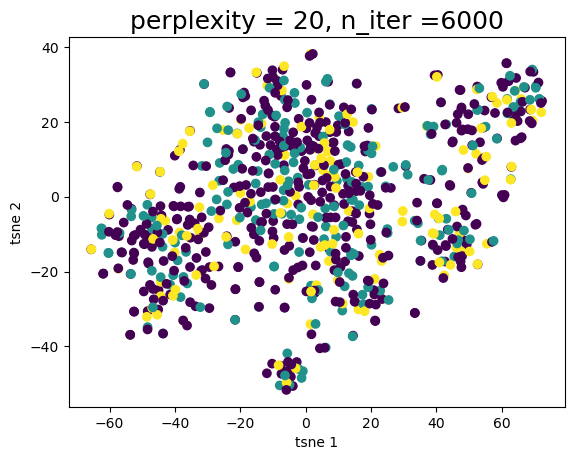

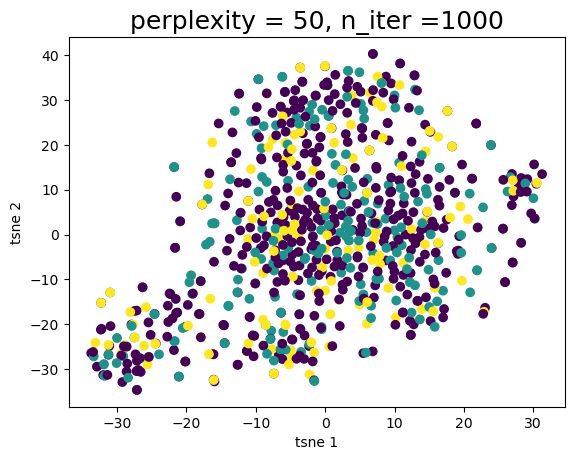

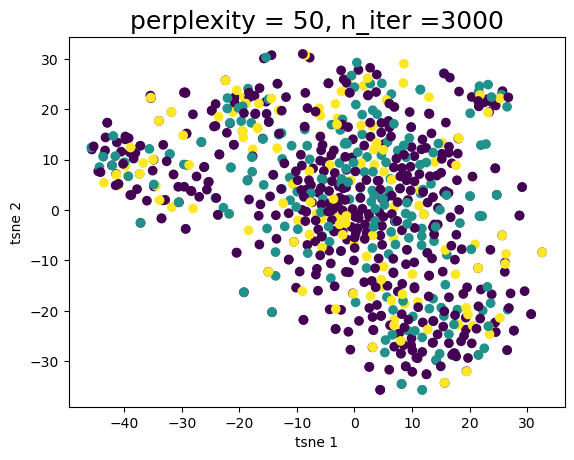

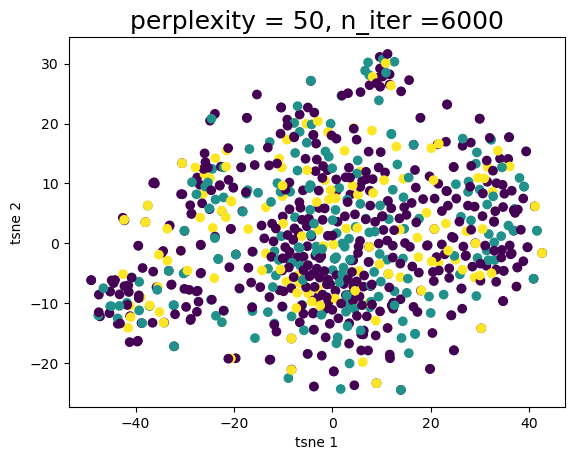

In [55]:
for p in (10,20,50):
    for n in (1000, 3000, 6000):
         draw_tsne(perplexity=p, n_iter=n , title='perplexity = {}, n_iter ={}'.format(p,n))

## Train the PCA reduced data with the a sequential CNNmodel
 1.  Data split
 2.  Building a model, model2
 3.  Model compile
 4.  Train the model
 5.  Model evaluation

In [100]:
from sklearn.model_selection import train_test_split
from keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

In [101]:
# Data split
X_train, X_test, y_train, y_test = train_test_split(image_reduced, class_labels_flatten, test_size=0.1, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

In [102]:
model2 = Sequential()
model2.add(Dense(128, activation='relu', kernel_regularizer=l2(0.03), input_shape=(366,)))
model2.add(BatchNormalization())  # Add BatchNormalization after the Dense layer
model2.add(Dropout(0.5))  # Add Dropout after the BatchNormalization

model2.add(Dense(64, activation='relu', kernel_regularizer=l2(0.03)))
model2.add(BatchNormalization())
model2.add(Dropout(0.5))

model2.add(Dense(32, activation='relu', kernel_regularizer=l2(0.03)))
model2.add(BatchNormalization())
model2.add(Dropout(0.5))

model2.add(Dense(3, activation='softmax'))

In [79]:
image_reduced.shape

(780, 366)

In [103]:
optimizer = Adam(learning_rate=0.0001)
model2.compile(optimizer=optimizer, loss='categorical_crossentropy',
              metrics=['categorical_accuracy'])

In [104]:
early_stopping = EarlyStopping(monitor='val_loss',  
                               patience=10,          
                               restore_best_weights=True)  # Restore model weights to the best seen during training

In [105]:
lr_schedule = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-6
)

In [106]:
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath='model_checkpoint.h5', save_best_only=True)

In [55]:
hist2 = model2.fit(
    X_train,
    y_train,
    epochs=1000,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping, lr_schedule,checkpoint_callback]
)

Epoch 1/1000
17/17 [==============================] - 1s 21ms/step - loss: 11.5722 - categorical_accuracy: 0.3270 - val_loss: 11.7673 - val_categorical_accuracy: 0.2614 - lr: 1.0000e-04
Epoch 2/1000
17/17 [==============================] - 0s 8ms/step - loss: 11.3882 - categorical_accuracy: 0.3289 - val_loss: 11.1740 - val_categorical_accuracy: 0.3011 - lr: 1.0000e-04
Epoch 3/1000
17/17 [==============================] - 0s 8ms/step - loss: 11.3629 - categorical_accuracy: 0.3327 - val_loss: 10.8343 - val_categorical_accuracy: 0.3239 - lr: 1.0000e-04
Epoch 4/1000
17/17 [==============================] - 0s 9ms/step - loss: 11.2878 - categorical_accuracy: 0.3574 - val_loss: 10.6186 - val_categorical_accuracy: 0.3693 - lr: 1.0000e-04
Epoch 5/1000
17/17 [==============================] - 0s 10ms/step - loss: 11.2447 - categorical_accuracy: 0.3498 - val_loss: 10.4621 - val_categorical_accuracy: 0.3920 - lr: 1.0000e-04
Epoch 6/1000
17/17 [==============================] - 0s 9ms/step - loss:

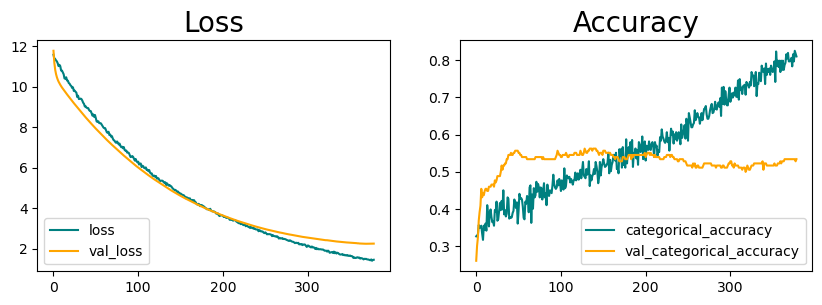

In [56]:
fig,ax = plt.subplots(1,2,figsize=(10,3))
ax[0].plot(hist2.history['loss'],color='teal',label='loss')
ax[0].plot(hist2.history['val_loss'],color='orange',label='val_loss')
ax[0].set_title('Loss',fontsize=20)
ax[0].legend(loc='lower left')

ax[1].plot(hist2.history['categorical_accuracy'],color='teal',label='categorical_accuracy')
ax[1].plot(hist2.history['val_categorical_accuracy'],color='orange',label='val_categorical_accuracy')
ax[1].set_title('Accuracy',fontsize=20)
ax[1].legend(loc='lower right')
plt.show()

Perform RandomSearch for model on the PCA reduced dataset

<h5>Model Evaluation</h5>

In [57]:
y_pred = model2.predict(X_test)

3/3 [==============================] - 0s 2ms/step


In [58]:
y_test.shape

(78, 3)

In [59]:
pre = Precision()
re = Recall()
acc = CategoricalAccuracy()
auc = AUC()

In [60]:
pre.update_state(y_test, y_pred)
re.update_state(y_test, y_pred)
acc.update_state(y_test, y_pred)
auc.update_state(y_test,y_pred)

In [61]:
print(f'Precision: {pre.result().numpy()}, Recall: {re.result().numpy()}, Accuracy: {acc.result().numpy()}, AUC: {auc.result().numpy()}')

Precision: 0.41791045665740967, Recall: 0.3589743673801422, Accuracy: 0.41025641560554504, AUC: 0.552925705909729


## Train the data with a Resnet CNNmodel
Explore more complex architectures with transfer learning. 
 1.  Data split
 2.  Building a model, resnet_model
 3.  Model compile
 4.  Train the model
 5.  Model evaluation

In [62]:
from tensorflow.keras.models import Model
from keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#from tensorflow.keras.layers import Concatenate

In [63]:
data = tf.keras.utils.image_dataset_from_directory('Data',batch_size=32,label_mode='categorical')

Found 780 files belonging to 3 classes.


In [65]:
# data.as_numpy_iterator().next()

In [147]:
scaled = data.map(lambda x,y: (x/255,y))

In [64]:
# scaled.as_numpy_iterator().next()

In [16]:
train_size = int(len(scaled)*.7)
val_size = int(len(scaled)*.2)
test_size = int(len(scaled)*.1)+1

In [17]:
train = scaled.take(train_size)
val = scaled.skip(train_size).take(val_size)
test = scaled.skip(train_size+val_size).take(test_size)

In [110]:
len(train)

17

In [18]:
resnet_model = Sequential()

pretrained_model= tf.keras.applications.ResNet50(include_top=False,
                   input_shape=(256,256,3),
                   pooling='max',
                   weights='imagenet') # feature exaction, extract meaningful features from the image

for layer in pretrained_model.layers[:165]:
    layer.trainable = False # freeze the 165 close to the top layer weights
for layer in pretrained_model.layers[165:]:
    layer.trainable = True # fine-tune the rest of layers(75)

resnet_model.add(pretrained_model)
resnet_model.add(Flatten())
resnet_model.add(Dense(512, activation='relu',kernel_regularizer=l2(0.03)))
resnet_model.add(Dropout(0.7))
resnet_model.add(Dense(3, activation='softmax')) # transfer learning layers

In [112]:
resnet_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense_4 (Dense)             (None, 512)               1049088   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 3)                 1539      
                                                                 
Total params: 24,638,339
Trainable params: 5,516,291
Non-trainable params: 19,122,048
_________________________________________________________________


In [113]:
resnet_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [114]:
hist3 = resnet_model.fit(train, epochs=300,validation_data=val,callbacks=[early_stopping,lr_schedule])

Epoch 1/300
17/17 [==============================] - 68s 4s/step - loss: 28.2553 - categorical_accuracy: 0.4357 - val_loss: 25.7979 - val_categorical_accuracy: 0.6000 - lr: 1.0000e-04
Epoch 2/300
17/17 [==============================] - 65s 4s/step - loss: 24.9216 - categorical_accuracy: 0.5092 - val_loss: 24.8002 - val_categorical_accuracy: 0.5562 - lr: 1.0000e-04
Epoch 3/300
17/17 [==============================] - 63s 4s/step - loss: 23.3851 - categorical_accuracy: 0.5202 - val_loss: 23.8555 - val_categorical_accuracy: 0.5875 - lr: 1.0000e-04
Epoch 4/300
17/17 [==============================] - 62s 4s/step - loss: 22.3901 - categorical_accuracy: 0.5165 - val_loss: 22.8640 - val_categorical_accuracy: 0.5625 - lr: 1.0000e-04
Epoch 5/300
17/17 [==============================] - 63s 4s/step - loss: 21.5586 - categorical_accuracy: 0.5478 - val_loss: 21.9072 - val_categorical_accuracy: 0.5813 - lr: 1.0000e-04
Epoch 6/300
17/17 [==============================] - 64s 4s/step - loss: 20.7568

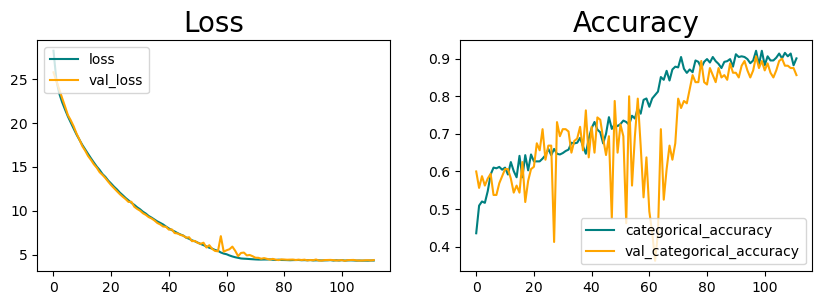

In [115]:
fig,ax = plt.subplots(1,2,figsize=(10,3))
ax[0].plot(hist3.history['loss'],color='teal',label='loss')
ax[0].plot(hist3.history['val_loss'],color='orange',label='val_loss')
ax[0].set_title('Loss',fontsize=20)
ax[0].legend(loc='upper left')

ax[1].plot(hist3.history['categorical_accuracy'],color='teal',label='categorical_accuracy')
ax[1].plot(hist3.history['val_categorical_accuracy'],color='orange',label='val_categorical_accuracy')
ax[1].set_title('Accuracy',fontsize=20)
ax[1].legend(loc='lower right')
plt.show()

In [116]:
pre = Precision()
re = Recall()
acc = CategoricalAccuracy()

In [117]:
for bat in test.as_numpy_iterator():
    X, y = bat
    yhat = resnet_model.predict(X)
    pre.update_state(y, yhat)
    re.update_state(y, yhat)
    acc.update_state(y, yhat)

1/1 [==============================] - 2s 2s/step


In [118]:
print(f'Precision:{pre.result().numpy()}, Recall:{re.result().numpy()},Accuracy:{acc.result().numpy()}')

Precision:0.9066666960716248, Recall:0.8947368264198303,Accuracy:0.8947368264198303


## To further improve the resnet model, apply augmentation to increase the data diversity

In [147]:
data = tf.keras.utils.image_dataset_from_directory('Data',batch_size=32,label_mode='categorical')

Found 780 files belonging to 3 classes.


In [19]:
data_augmentation = keras.Sequential(
  [
    keras.layers.RandomFlip("horizontal",input_shape=(256,256,3),seed=42),
    keras.layers.RandomRotation(0.1,seed=42),
    keras.layers.RandomZoom(0.1,seed=42),
  ]
)

In [20]:
# Build a Sequential model, add the layer for data augmentation
resnet_model2 = Sequential()

resnet_model2.add(data_augmentation) # data augmentation layer to increase the training data size

pretrained_model= tf.keras.applications.ResNet50(include_top=False,
                   input_shape=(256,256,3),
                   pooling='max',
                   weights='imagenet') # feature exaction, extract meaningful features from the image

for layer in pretrained_model.layers[:165]:
    layer.trainable = False # freeze the 165 close to the top layer weights
for layer in pretrained_model.layers[165:]:
    layer.trainable = True # fine-tune the rest of layers

resnet_model2.add(pretrained_model)
resnet_model2.add(Flatten())
resnet_model2.add(Dense(512, activation='relu',kernel_regularizer=l2(0.03)))
resnet_model2.add(Dropout(0.7))
resnet_model2.add(Dense(3, activation='softmax'))

In [21]:
# Print model summary
resnet_model2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 512)               1049088   
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_3 (Dense)             (None, 3)                 1539      
                                                                 
Total params: 24,638,339
Trainable params: 5,516,291
N

In [22]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint("resnet0.4_best_model.h5", save_best_only=True, monitor='val_categorical_accuracy', mode='min')

In [25]:
early_stopping = EarlyStopping(monitor='val_loss',  # Monitor validation loss
                               patience=10,          # Number of epochs with no improvement after which training will stop
                               restore_best_weights=True)  # Restore model weights to the best seen during training

In [26]:
lr_schedule = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.4,
    patience=3,
    min_lr=1e-8
)

In [27]:
resnet_model2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [28]:
hist4 = resnet_model2.fit(train, epochs=300,validation_data=val,callbacks=[early_stopping,lr_schedule,checkpoint])

Epoch 1/300
17/17 [==============================] - 65s 4s/step - loss: 28.5006 - categorical_accuracy: 0.4081 - val_loss: 24.8357 - val_categorical_accuracy: 0.5750 - lr: 1.0000e-04
Epoch 2/300
17/17 [==============================] - 59s 3s/step - loss: 25.1451 - categorical_accuracy: 0.4632 - val_loss: 24.0502 - val_categorical_accuracy: 0.5938 - lr: 1.0000e-04
Epoch 3/300
17/17 [==============================] - 59s 3s/step - loss: 23.4195 - categorical_accuracy: 0.4688 - val_loss: 23.3300 - val_categorical_accuracy: 0.5625 - lr: 1.0000e-04
Epoch 4/300
17/17 [==============================] - 58s 3s/step - loss: 22.3935 - categorical_accuracy: 0.5496 - val_loss: 22.3750 - val_categorical_accuracy: 0.5750 - lr: 1.0000e-04
Epoch 5/300
17/17 [==============================] - 59s 3s/step - loss: 21.5017 - categorical_accuracy: 0.5478 - val_loss: 21.5094 - val_categorical_accuracy: 0.5437 - lr: 1.0000e-04
Epoch 6/300
17/17 [==============================] - 59s 3s/step - loss: 20.7247

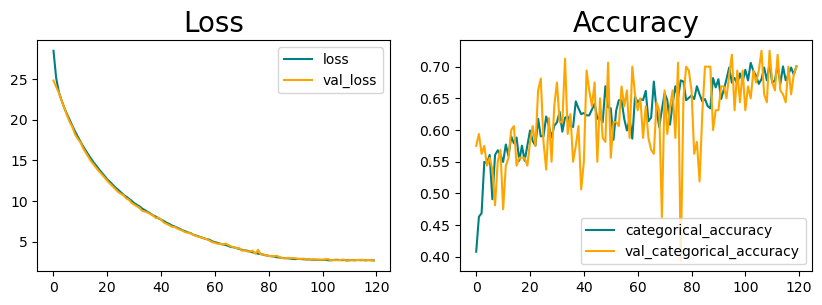

In [29]:
fig,ax = plt.subplots(1,2,figsize=(10,3))
ax[0].plot(hist4.history['loss'],color='teal',label='loss')
ax[0].plot(hist4.history['val_loss'],color='orange',label='val_loss')
ax[0].set_title('Loss',fontsize=20)
ax[0].legend(loc='upper right')

ax[1].plot(hist4.history['categorical_accuracy'],color='teal',label='categorical_accuracy')
ax[1].plot(hist4.history['val_categorical_accuracy'],color='orange',label='val_categorical_accuracy')
ax[1].set_title('Accuracy',fontsize=20)
ax[1].legend(loc='lower right')
plt.show()

In [248]:
#resnet_model2.save("resnet_model2b.h5")

In [30]:
pre = Precision()
re = Recall()
acc = CategoricalAccuracy()

In [39]:
from tensorflow.keras.models import load_model

resnet_model2b = load_model("resnet0.4_best_model.h5")

In [40]:
for bat in test.as_numpy_iterator():
    X, y = bat
    yhat = resnet_model2b.predict(X)
    pre.update_state(y, yhat)
    re.update_state(y, yhat)
    acc.update_state(y, yhat)

1/1 [==============================] - 2s 2s/step


In [41]:
print(f'Precision:{pre.result().numpy()}, Recall:{re.result().numpy()},Accuracy:{acc.result().numpy()}')

Precision:0.4545454680919647, Recall:0.35087719559669495,Accuracy:0.4517543911933899


In [42]:
resnet_model3 = Sequential()

resnet_model3.add(data_augmentation) # data augmentation layer to increase the training data size

pretrained_model= tf.keras.applications.ResNet50(include_top=False,
                   input_shape=(256,256,3),
                   pooling='max',
                   weights='imagenet') # feature exaction, extract meaningful features from the image

for layer in pretrained_model.layers[:165]:
    layer.trainable = False # freeze the 165 close to the top layer weights
for layer in pretrained_model.layers[165:]:
    layer.trainable = True # fine-tune the rest of layers

resnet_model3.add(pretrained_model)
resnet_model3.add(Flatten())
resnet_model3.add(Dense(512, activation='relu',kernel_regularizer=l2(0.03)))
resnet_model3.add(Dropout(0.7))
resnet_model3.add(Dense(3, activation='softmax'))

In [43]:
from tensorflow.keras.models import load_model

resnet_model3.load_weights("resnet0.4_best_model.h5")

In [44]:
resnet_model3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten_2 (Flatten)         (None, 2048)              0         
                                                                 
 dense_4 (Dense)             (None, 512)               1049088   
                                                                 
 dropout_2 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 3)                 1539      
                                                                 
Total params: 24,638,339
Trainable params: 5,516,291
N

In [253]:
# check the training data shape
sample_data = next(iter(train)) 
data_shape = sample_data[0].shape  

print("Data shape:", data_shape)

Data shape: (32, 256, 256, 3)


In [45]:
checkpoint = ModelCheckpoint("resnet0.4b_best_model.h5", save_best_only=True, monitor='val_categorical_accuracy', mode='min')

In [46]:
initial_learning_rate = 1e-7
lr_schedule = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.4,
    patience=3,
    min_lr=1e-9
)
# Compile the model 
resnet_model3.compile(optimizer=keras.optimizers.Adam(learning_rate=initial_learning_rate), loss='categorical_crossentropy',metrics=['categorical_accuracy'])

# Resume training
hist5= resnet_model3.fit(train, epochs=275,validation_data=val, callbacks=[early_stopping,lr_schedule,checkpoint])

Epoch 1/275
17/17 [==============================] - 66s 4s/step - loss: 3.5875 - categorical_accuracy: 0.6140 - val_loss: 3.7517 - val_categorical_accuracy: 0.5000 - lr: 1.0000e-07
Epoch 2/275
17/17 [==============================] - 59s 3s/step - loss: 3.5564 - categorical_accuracy: 0.6103 - val_loss: 3.7196 - val_categorical_accuracy: 0.4938 - lr: 1.0000e-07
Epoch 3/275
17/17 [==============================] - 56s 3s/step - loss: 3.5575 - categorical_accuracy: 0.6213 - val_loss: 3.6485 - val_categorical_accuracy: 0.5250 - lr: 1.0000e-07
Epoch 4/275
17/17 [==============================] - 56s 3s/step - loss: 3.5601 - categorical_accuracy: 0.6213 - val_loss: 3.5924 - val_categorical_accuracy: 0.6000 - lr: 1.0000e-07
Epoch 5/275
17/17 [==============================] - 58s 3s/step - loss: 3.5350 - categorical_accuracy: 0.6268 - val_loss: 3.5491 - val_categorical_accuracy: 0.6500 - lr: 1.0000e-07
Epoch 6/275
17/17 [==============================] - 57s 3s/step - loss: 3.5674 - categori

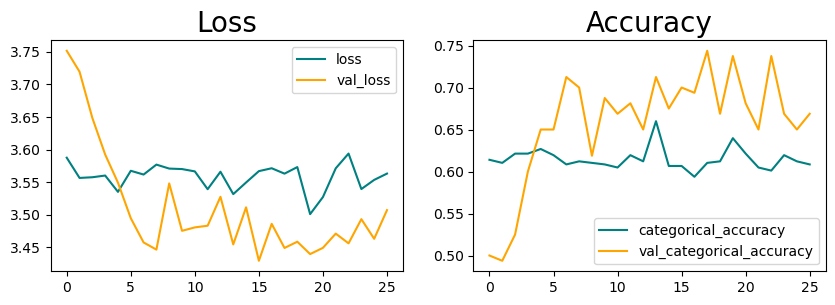

In [47]:
fig,ax = plt.subplots(1,2,figsize=(10,3))
ax[0].plot(hist5.history['loss'],color='teal',label='loss')
ax[0].plot(hist5.history['val_loss'],color='orange',label='val_loss')
ax[0].set_title('Loss',fontsize=20)
ax[0].legend(loc='upper right')

ax[1].plot(hist5.history['categorical_accuracy'],color='teal',label='categorical_accuracy')
ax[1].plot(hist5.history['val_categorical_accuracy'],color='orange',label='val_categorical_accuracy')
ax[1].set_title('Accuracy',fontsize=20)
ax[1].legend(loc='lower right')
plt.show()

In [48]:
pre = Precision()
re = Recall()
acc = CategoricalAccuracy()

In [49]:
for bat in test.as_numpy_iterator():
    X, y = bat
    yhat = resnet_model3.predict(X)
    pre.update_state(y, yhat)
    re.update_state(y, yhat)
    acc.update_state(y, yhat)

1/1 [==============================] - 1s 1s/step


In [50]:
print(f'Precision:{pre.result().numpy()}, Recall:{re.result().numpy()},Accuracy:{acc.result().numpy()}')

Precision:0.8297872543334961, Recall:0.5131579041481018,Accuracy:0.6710526347160339


In [51]:
resnet_model3b = load_model("resnet0.4b_best_model.h5")
for bat in test.as_numpy_iterator():
    X, y = bat
    yhat = resnet_model3b.predict(X)
    pre.update_state(y, yhat)
    re.update_state(y, yhat)
    acc.update_state(y, yhat)

1/1 [==============================] - 2s 2s/step


In [52]:
print(f'Precision:{pre.result().numpy()}, Recall:{re.result().numpy()},Accuracy:{acc.result().numpy()}')

Precision:0.7191011309623718, Recall:0.42105263471603394,Accuracy:0.6118420958518982


## Summary
In summary, the 4 trainable layers CNN model with the following optimized parameters ('conv_1_filter': 112, 'conv_1_kernel': 3, 'conv_1_strides': 1, 'conv_2_filter': 64, 'conv_2_kernel': 3, 'conv_2_strides': 1, 'conv_3_filter': 64, 'conv_3_kernel': 3, 'conv_3_strides': 1, 'learning_rate': 0.0001) delivered superior performance compared to other Resnet50 deep learning models. It achieved an impressive precision score of 0.96, a recall score of 0.96, an accuracy score of 0.96, and an AUC of 0.99.

In contrast, the Resnet50 model exhibited slightly lower performance metrics, with a precision score of 0.91, a recall score of 0.89, and an accuracy score of 0.89. Moreover, when applying image augmentation to the Resnet50 model, its performance further declined, resulting in a precision score of 0.80, a recall score of 0.69, and an accuracy score of 0.73.


### Flask app development
To provide a web-based interface for users to access and use the trained model, I developed a flask app which allows the users to upload a image in tif or png format and predict the classification of the image.

#### Below is the html file for the web page:


#### Below is the Flask application code:

In [ ]:
from flask import Flask, request, render_template
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import os
import io

app = Flask(__name__)

# Load the trained CNN model
model = load_model(os.path.join('models', 'BreastCancerDetection.h5'))

@app.route('/')
def home():
    return render_template('index.html')

@app.route('/upload', methods=['POST'])
def upload_file():
    uploaded_file = request.files['BreastUltrasoundImage']
    if uploaded_file:
        file_contents = uploaded_file.read()
        return file_contents  # Return the file contents

@app.route('/predict', methods=['POST'])
def predict():
    # Get the uploaded image from the request
    uploaded_file_data = upload_file()

    # Process the uploaded image
    img = image.load_img(io.BytesIO(uploaded_file_data), target_size=(256, 256))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array / 255, axis=0)

    # Make predictions
    predictions = model.predict(img_array)

    # Process predictions as needed
    # class_labels = np.argmax(predictions, axis=1)

    return render_template('index.html', predictions=np.round(predictions,2))
    #predictions=class_labels[0]

if __name__ == '__main__':
    app.run(debug=True)
